<a href="https://colab.research.google.com/github/TarefBilel/Retail_Demand_forecasting_ML/blob/main/TFM_Modelling(Dataset_1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install "u8darts[all]"

## First dataset

## 1. Importing the technologies and the dataset

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

## 2. Modelling

In [ ]:
df=pd.read_csv("/content/drive/MyDrive/TFM/Walmart_Cleaned.csv",parse_dates=["Date"])
df=df.drop("Unnamed: 0",axis=1)
df

,Date,Weekly_Sales
0,2010-02-05,49750740.50
1,2010-02-12,48336677.63
2,2010-02-19,48276993.78
3,2010-02-26,43968571.13
4,2010-03-05,46871470.30
...,...,...
138,2012-09-28,43734899.40
139,2012-10-05,47566639.31
140,2012-10-12,46128514.25
141,2012-10-19,45122410.57


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df["Date"]=pd.to_datetime(df["Date"],format='%d-%m-%Y')

In [ ]:
df.set_index("Date",inplace=True)
df=df.sort_index()

In [ ]:
df.head(10)

,Weekly_Sales
Date,
2010-02-05,49750740.50
2010-02-12,48336677.63
2010-02-19,48276993.78
2010-02-26,43968571.13
2010-03-05,46871470.30
2010-03-12,45925396.51
2010-03-19,44988974.64
2010-03-26,44133961.05
2010-04-02,50423831.26


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 143 entries, 2010-02-05 to 2012-10-26
Data columns (total 1 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Weekly_Sales  143 non-null    float64
dtypes: float64(1)
memory usage: 2.2 KB


Text(0.5, 1.0, 'Valores perdidos')

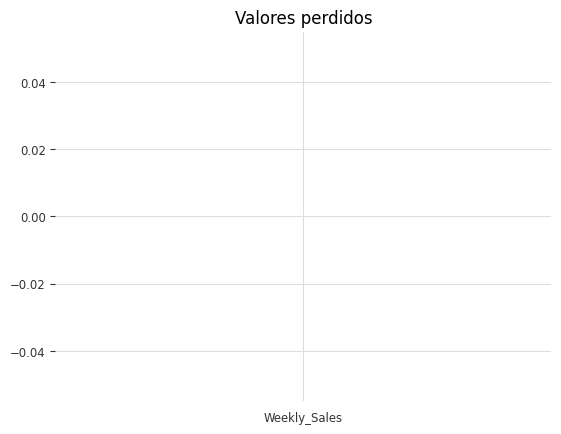

In [ ]:
plt.plot(df.isna().sum())
plt.title("Valores perdidos")

## 3. Working with **Darts**

In [ ]:
from darts import TimeSeries

In [ ]:
df=df.resample('W').sum()

<Axes: xlabel='Date'>

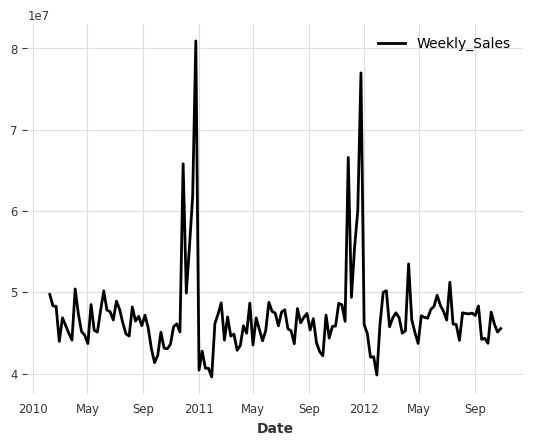

In [ ]:
df_series=TimeSeries.from_dataframe(df,time_col=None,value_cols="Weekly_Sales",freq="W")
df_series.plot()

In [ ]:
print(df_series.time_index.freq)

<Week: weekday=6>


## 4. Backtesting

In [ ]:
from darts.models import AutoARIMA, Prophet, NaiveDrift
from darts.metrics import rmse, mse, mape, smape

## 4.1 Rolling Window

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 7.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpczvbey2r/hrz4neh0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpczvbey2r/younnbc6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40178', 'data', 'file=/tmp/tmpczvbey2r/hrz4neh0.json', 'init=/tmp/tmpczvbey2r/younnbc6.json', 'output', 'file=/tmp/tmpczvbey2r/prophet_modelxf0cq6t4/prophet_model-20250709123506.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
12:35:06 - cmdstanpy - INFO - Chain [1] start processing
IN

        Model  Horizon       MAPE           MSE          RMSE      SMAPE
0   AutoARIMA        4   8.591262  5.938446e+13  4.732700e+06   8.119966
1     Prophet        4   9.738678  6.532081e+13  5.206468e+06   9.289173
2  NaiveDrift        4   9.652424  6.781004e+13  5.166909e+06   9.180361
3   AutoARIMA        8   9.134174  6.613684e+13  5.404407e+06   8.744286
4     Prophet        8  11.481965  8.992441e+13  6.423516e+06  11.156992
5  NaiveDrift        8  11.906019  1.014721e+14  6.631578e+06  11.502523
6   AutoARIMA       12   9.278595  6.863952e+13  5.811909e+06   8.936006
7     Prophet       12  12.853306  1.147451e+14  7.457394e+06  12.741155
8  NaiveDrift       12  13.616219  1.355719e+14  7.835686e+06  13.459165


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 7.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpczvbey2r/19kitrwj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpczvbey2r/9d54kzjv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6691', 'data', 'file=/tmp/tmpczvbey2r/19kitrwj.json', 'init=/tmp/tmpczvbey2r/9d54kzjv.json', 'output', 'file=/tmp/tmpczvbey2r/prophet_model0w_27nyl/prophet_model-20250709123714.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
12:37:14 - cmdstanpy - INFO - Chain [1] start processing
INF

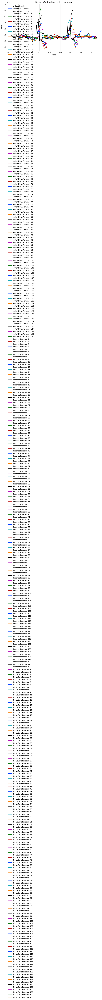

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 7.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpczvbey2r/w1gvlni_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpczvbey2r/rnq431or.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=58295', 'data', 'file=/tmp/tmpczvbey2r/w1gvlni_.json', 'init=/tmp/tmpczvbey2r/rnq431or.json', 'output', 'file=/tmp/tmpczvbey2r/prophet_model3d69nog8/prophet_model-20250709123857.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
12:38:57 - cmdstanpy - INFO - Chain [1] start processing
IN

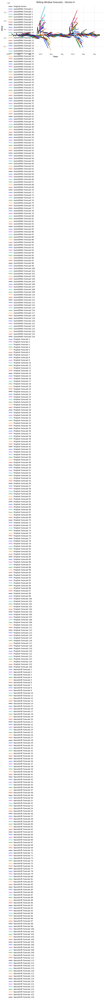

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 7.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpczvbey2r/su1_7fwm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpczvbey2r/5hiwi395.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45187', 'data', 'file=/tmp/tmpczvbey2r/su1_7fwm.json', 'init=/tmp/tmpczvbey2r/5hiwi395.json', 'output', 'file=/tmp/tmpczvbey2r/prophet_modeldxzqsh3e/prophet_model-20250709124044.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
12:40:44 - cmdstanpy - INFO - Chain [1] start processing
IN

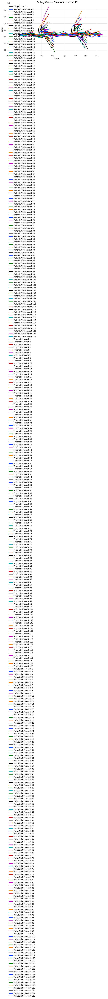

In [ ]:
forecast_horizons=[4,8,12]

models = {
    "AutoARIMA": AutoARIMA(),
    "Prophet": Prophet(),
    "NaiveDrift": NaiveDrift(),


}

# Initialize dictionary to hold metrics
results_rolling = {
    "Model": [],
    "Horizon": [],
    "MAPE": [],
    "MSE": [],
    "RMSE": [],
    "SMAPE":[]
}

# Perform rolling window forecast and evaluate
for horizon in forecast_horizons:
    # Initialize lists to store metrics for each forecast within this horizon
    mape_list = []
    mse_list = []
    rmse_list = []
    smape_list = []
    forecasts_list = []

    for model_name, model in models.items():
        forecasts = model.historical_forecasts(
            df_series,
            train_length=10,              # <-- ventana fija de 20 semanas (elige de cuanto es esa ventana que se va moviendo. Aquí es de 20 semanas,)
    forecast_horizon=horizon,            # 4-week horizon Esto tendrás que cambiarlo
    stride=1,                      # evaluamos cada nueva semana
    retrain=True,                  # re-entra en cada corte
    overlap_end=False,             # no predecir más allá del final
    last_points_only=False,        # queremos los 4 puntos completos
    verbose=False
        )
        # Calculate metrics for each individual forecast and store them
        for forecast in forecasts:
          actual = df_series.slice_intersect(forecast)
          mape_list.append(mape(actual, forecast))
          mse_list.append(mse(actual, forecast))
          rmse_list.append(rmse(actual, forecast))
          smape_list.append(smape(actual, forecast))
        forecasts_list.append(forecasts) # Store forecasts for plotting


        # Append average metrics to results dictionary
        results_rolling["Model"].append(model_name)
        results_rolling["Horizon"].append(horizon)
        results_rolling["MAPE"].append(np.mean(mape_list))
        results_rolling["MSE"].append(np.mean(mse_list))
        results_rolling["RMSE"].append(np.mean(rmse_list))
        results_rolling["SMAPE"].append(np.mean(smape_list))

# Create and print results dataframe
results_rolling_df_univ = pd.DataFrame(results_rolling)
print(results_rolling_df_univ)

# Plot rolling forecasts for each horizon
for horizon in forecast_horizons:
    plt.figure(figsize=(10, 5))
    df_series.plot(label="Original Series")

    for model_name, model in models.items():
        forecasts = model.historical_forecasts(
            df_series,
            train_length=10,
            forecast_horizon=horizon,
            stride=1,
            retrain=True,
            overlap_end=False,
            last_points_only=False,
            verbose=False
        )
        # Plot each forecast in the list
        for i, forecast in enumerate(forecasts):
          forecast.plot(label=f"{model_name} Forecast {i+1}")


    plt.title(f"Rolling Window Forecasts - Horizon {horizon}")
    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [ ]:
results_rolling_df_univ

,Model,Horizon,MAPE,MSE,RMSE,SMAPE
0,AutoARIMA,4,8.591262,5.938446e+13,4.732700e+06,8.119966
1,Prophet,4,9.738678,6.532081e+13,5.206468e+06,9.289173
2,NaiveDrift,4,9.652424,6.781004e+13,5.166909e+06,9.180361
3,AutoARIMA,8,9.134174,6.613684e+13,5.404407e+06,8.744286
4,Prophet,8,11.481965,8.992441e+13,6.423516e+06,11.156992
5,NaiveDrift,8,11.906019,1.014721e+14,6.631578e+06,11.502523
6,AutoARIMA,12,9.278595,6.863952e+13,5.811909e+06,8.936006
7,Prophet,12,12.853306,1.147451e+14,7.457394e+06,12.741155
8,NaiveDrift,12,13.616219,1.355719e+14,7.835686e+06,13.459165


## 4.2 Expanding Window

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 21.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpczvbey2r/x7saa65f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpczvbey2r/e57ikktf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32163', 'data', 'file=/tmp/tmpczvbey2r/x7saa65f.json', 'init=/tmp/tmpczvbey2r/e57ikktf.json', 'output', 'file=/tmp/tmpczvbey2r/prophet_model6_nn19w7/prophet_model-20250709125014.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
12:50:14 - cmdstanpy - INFO - Chain [1] start processing
I

Expanding Window Forecast Evaluation Results:

        Model  Horizon       MAPE           MSE          RMSE      SMAPE
1     Prophet        4   6.851596  4.139928e+13  4.273837e+06   7.036912
0   AutoARIMA        4   7.078841  4.443244e+13  4.343746e+06   7.132259
2  NaiveDrift        4   8.739018  6.076869e+13  4.843229e+06   8.324525
4     Prophet        8   6.995642  4.479086e+13  4.814356e+06   7.246039
3   AutoARIMA        8   7.007156  4.575235e+13  4.776947e+06   7.147225
5  NaiveDrift        8  10.373954  7.952256e+13  6.043700e+06   9.951897
6   AutoARIMA       12   6.884849  4.567944e+13  5.075455e+06   7.068611
7     Prophet       12   7.006483  4.610455e+13  5.188882e+06   7.287071
8  NaiveDrift       12  10.890951  8.942449e+13  6.703511e+06  10.549971


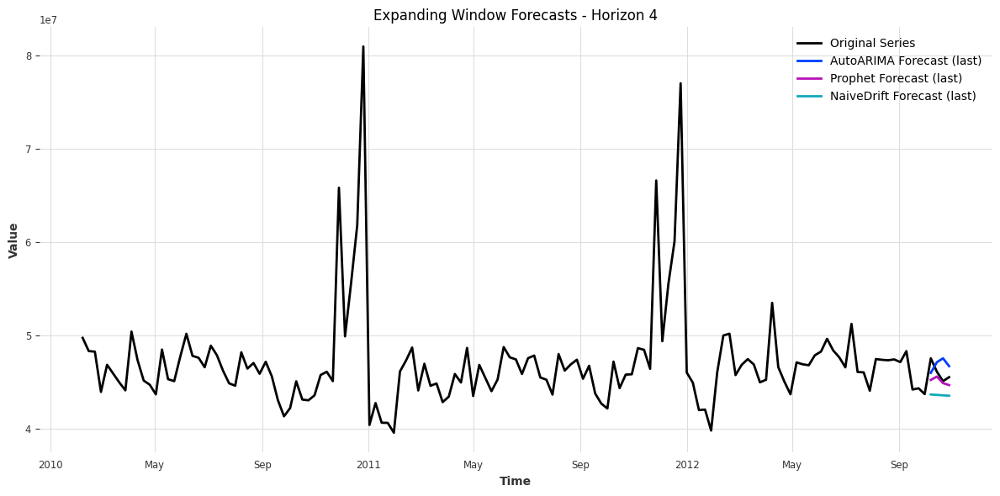

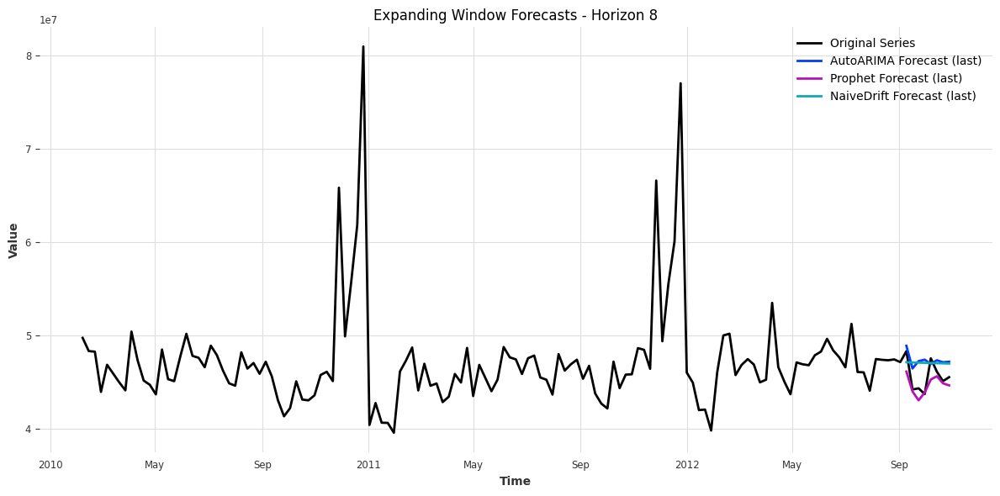

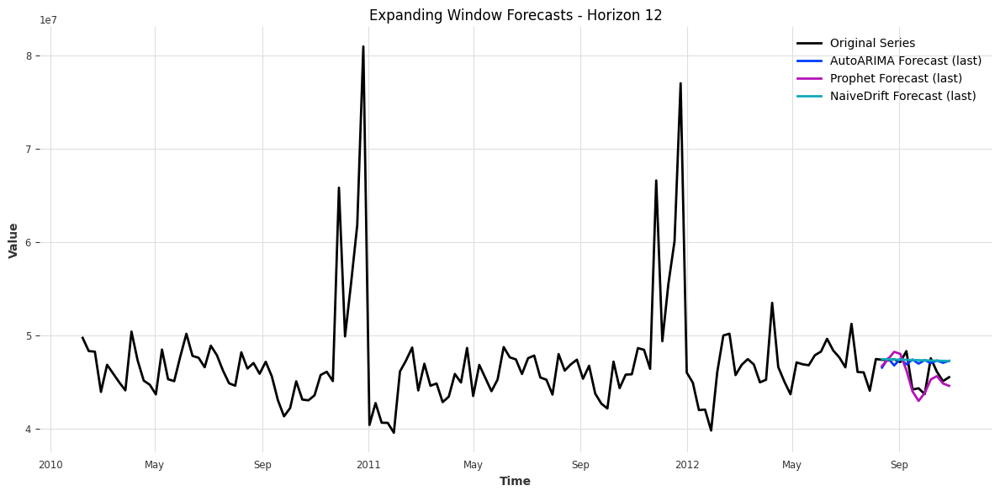

In [ ]:
models = {
    "AutoARIMA": AutoARIMA(),
    "Prophet": Prophet(),
    "NaiveDrift": NaiveDrift(),
}

forecast_horizons = [4, 8, 12]

results_expanding = {
    "Model": [],
    "Horizon": [],
    "MAPE": [],
    "MSE": [],
    "RMSE": [],
    "SMAPE": []
}

expanding_forecasts = {h: {} for h in forecast_horizons}

for horizon in forecast_horizons:
    for model_name, model in models.items():
        forecast_list = model.historical_forecasts(
            df_series,
            start=0.2,
            forecast_horizon=horizon,
            stride=1,
            retrain=True,
            last_points_only=False,
            verbose=False
        )

        # Align actual series slices to forecasts
        actual_list = [df_series.slice_intersect(forecast) for forecast in forecast_list]

        # Compute metrics across all forecasts
        mape_list = [mape(actual, forecast) for actual, forecast in zip(actual_list, forecast_list)]
        mse_list = [mse(actual, forecast) for actual, forecast in zip(actual_list, forecast_list)]
        rmse_list = [rmse(actual, forecast) for actual, forecast in zip(actual_list, forecast_list)]
        smape_list = [smape(actual, forecast) for actual, forecast in zip(actual_list, forecast_list)]

        # Take average of metrics
        results_expanding["Model"].append(model_name)
        results_expanding["Horizon"].append(horizon)
        results_expanding["MAPE"].append(np.mean(mape_list))
        results_expanding["MSE"].append(np.mean(mse_list))
        results_expanding["RMSE"].append(np.mean(rmse_list))
        results_expanding["SMAPE"].append(np.mean(smape_list))

        expanding_forecasts[horizon][model_name] = forecast_list

results_expanding_df_univ = pd.DataFrame(results_expanding)
print("Expanding Window Forecast Evaluation Results:\n")
print(results_expanding_df_univ.sort_values(by=["Horizon", "MAPE"]))

# Plotting the last forecast as an example for each horizon
for horizon in forecast_horizons:
    plt.figure(figsize=(12, 6))
    df_series.plot(label="Original Series")

    for model_name, forecast_list in expanding_forecasts[horizon].items():
        # Just plotting the last forecast from the expanding window
        forecast_list[-1].plot(label=f"{model_name} Forecast (last)")

    plt.title(f"Expanding Window Forecasts - Horizon {horizon}")
    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [ ]:
results_expanding_df_univ

,Model,Horizon,MAPE,MSE,RMSE,SMAPE
0,AutoARIMA,4,7.078841,4.443244e+13,4.343746e+06,7.132259
1,Prophet,4,6.851596,4.139928e+13,4.273837e+06,7.036912
2,NaiveDrift,4,8.739018,6.076869e+13,4.843229e+06,8.324525
3,AutoARIMA,8,7.007156,4.575235e+13,4.776947e+06,7.147225
4,Prophet,8,6.995642,4.479086e+13,4.814356e+06,7.246039
5,NaiveDrift,8,10.373954,7.952256e+13,6.043700e+06,9.951897
6,AutoARIMA,12,6.884849,4.567944e+13,5.075455e+06,7.068611
7,Prophet,12,7.006483,4.610455e+13,5.188882e+06,7.287071
8,NaiveDrift,12,10.890951,8.942449e+13,6.703511e+06,10.549971


## 5. Preparing the multivariate dataset

In [ ]:
df_multi=df.copy()
df_multi

,Weekly_Sales
Date,
2010-02-07,49750740.50
2010-02-14,48336677.63
2010-02-21,48276993.78
2010-02-28,43968571.13
2010-03-07,46871470.30
...,...
2012-09-30,43734899.40
2012-10-07,47566639.31
2012-10-14,46128514.25


In [ ]:
df_multi["week_of_year"]=df_multi.index.isocalendar().week
df_multi["month"]=df_multi.index.month
df_multi["year"]=df_multi.index.year


In [ ]:
df_multi.head(20)

,Weekly_Sales,week_of_year,month,year
Date,,,,
2010-02-07,49750740.50,5,2,2010
2010-02-14,48336677.63,6,2,2010
2010-02-21,48276993.78,7,2,2010
2010-02-28,43968571.13,8,2,2010
2010-03-07,46871470.30,9,3,2010
2010-03-14,45925396.51,10,3,2010
2010-03-21,44988974.64,11,3,2010
2010-03-28,44133961.05,12,3,2010
2010-04-04,50423831.26,13,4,2010


In [ ]:
!pip install workalendar


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.8/5.8 MB 67.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 210.7/210.7 kB 21.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.9/47.9 kB 4.7 MB/s eta 0:00:00
  Created wheel for pymeeus: filename=PyMeeus-0.5.12-py3-none-any.whl size=732000 sha256=31e8bdde1b7ab0be8a7c178e3446c38ec91550c846e092a85ce5b0b7e047e33f
  Stored in directory: /root/.cache/pip/wheels/8f/bd/f9/5c4c39b529e0322b08979e1c465e203218bc2cca75d20f7df5
Successfully built pymeeus


In [ ]:
from workalendar.registry import registry
from workalendar.usa import UnitedStates

cal = UnitedStates()  # Change "US" to your country if needed

# Create empty list for holiday flags
holiday_flags = []

# Loop through each weekly date
for date in df.index:
    is_holiday = 0
    for d in range(7):
        check_date = (date - pd.Timedelta(days=d)).date()
        if cal.is_holiday(check_date):
            is_holiday = 1
            break
    holiday_flags.append(is_holiday)

# Add column to DataFrame
df_multi["is_holiday"] = holiday_flags

In [ ]:
df_multi

,Weekly_Sales,week_of_year,month,year,is_holiday
Date,,,,,
2010-02-07,49750740.50,5,2,2010,0
2010-02-14,48336677.63,6,2,2010,0
2010-02-21,48276993.78,7,2,2010,1
2010-02-28,43968571.13,8,2,2010,0
2010-03-07,46871470.30,9,3,2010,0
...,...,...,...,...,...
2012-09-30,43734899.40,39,9,2012,0
2012-10-07,47566639.31,40,10,2012,0
2012-10-14,46128514.25,41,10,2012,1


In [ ]:
df_multi[df_multi["is_holiday"]==1]

,Weekly_Sales,week_of_year,month,year,is_holiday
Date,,,,,
2010-02-21,48276993.78,7,2,2010,1
2010-06-06,50188543.12,22,6,2010,1
2010-07-04,48917484.50,26,7,2010,1
2010-07-11,47899529.37,27,7,2010,1
2010-09-12,45634397.84,36,9,2010,1
2010-10-17,43149473.45,41,10,2010,1
2010-11-14,46124800.83,45,11,2010,1
2010-11-28,65821003.24,47,11,2010,1
2010-12-26,80931415.60,51,12,2010,1


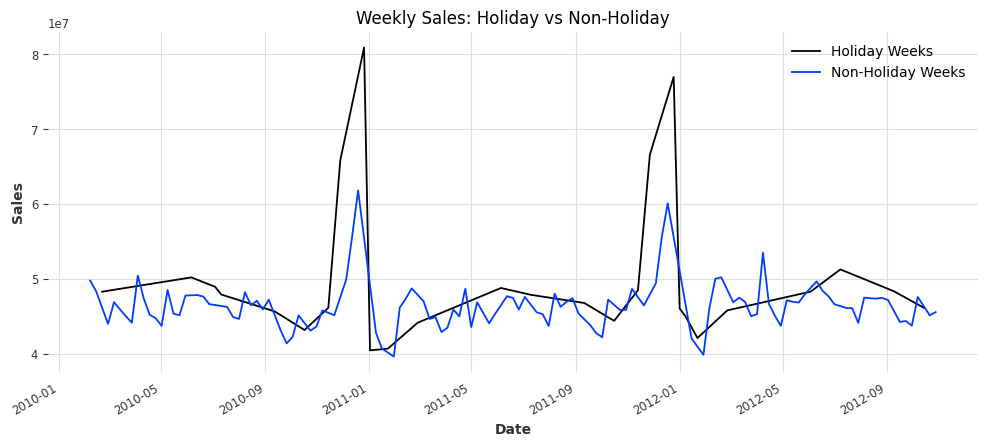

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 5))
df_multi[df_multi["is_holiday"] == 1]["Weekly_Sales"].plot(label="Holiday Weeks")
df_multi[df_multi["is_holiday"] == 0]["Weekly_Sales"].plot(label="Non-Holiday Weeks")
plt.title("Weekly Sales: Holiday vs Non-Holiday")
plt.ylabel("Sales")
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
df_multi=df_multi.resample("W").sum()


In [ ]:
df_multi.head()

,Weekly_Sales,week_of_year,month,year,is_holiday
Date,,,,,
2010-02-07,49750740.50,5,2,2010,0
2010-02-14,48336677.63,6,2,2010,0
2010-02-21,48276993.78,7,2,2010,1
2010-02-28,43968571.13,8,2,2010,0
2010-03-07,46871470.30,9,3,2010,0


## 5.1 Working with **Darts**

In [ ]:
from darts import TimeSeries

In [ ]:
df_multi_series=TimeSeries.from_dataframe(df_multi,time_col=None,value_cols=["Weekly_Sales","week_of_year","month","year","is_holiday"],freq="W")


In [ ]:
target_series=df_multi_series["Weekly_Sales"]
covariates_series=df_multi_series.drop_columns(["Weekly_Sales"])

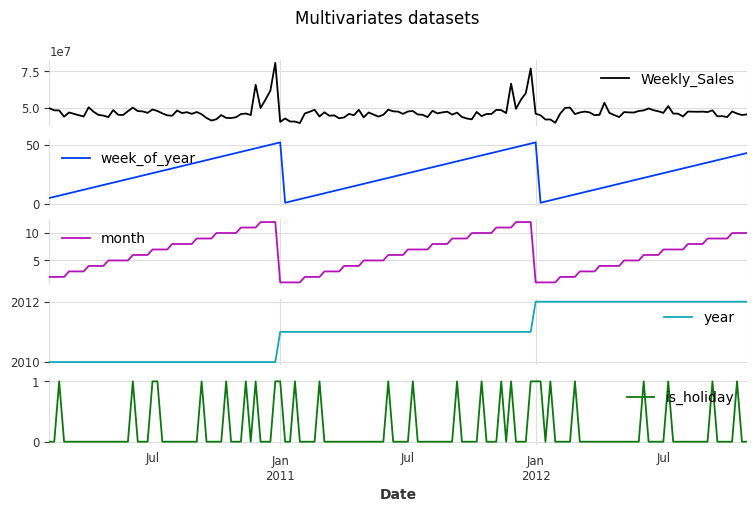

In [ ]:
df_plot = df_multi_series.to_dataframe()
df_plot.plot(subplots=True,figsize=(9,5),title="Multivariates datasets")

plt.show()

## 5.1.1 Backtesting

## Rolling window

In [ ]:
from darts.models import RegressionModel, LightGBMModel, CatBoostModel
from sklearn.linear_model import LinearRegression

Training LinearRegression (baseline) with horizon 4...


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configura

Training CatBoost with horizon 4...


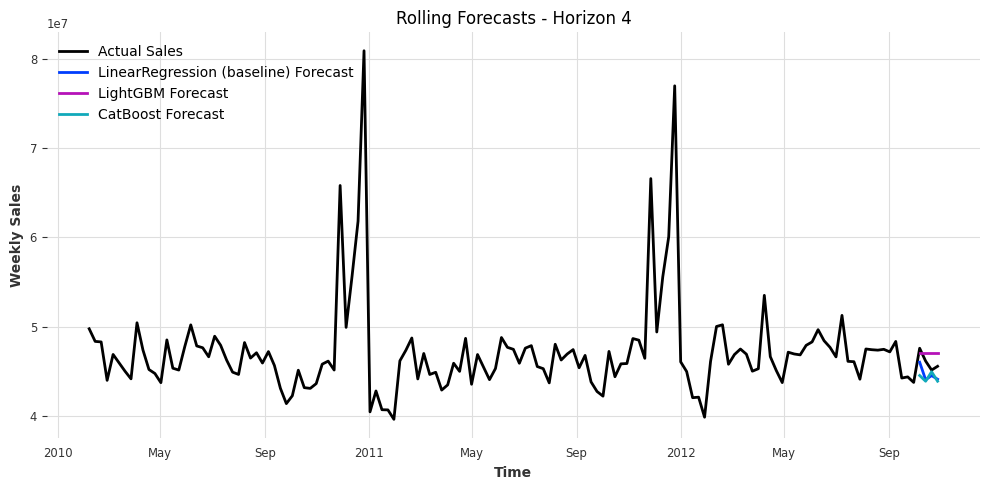

Training LinearRegression (baseline) with horizon 8...


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configura

Training CatBoost with horizon 8...


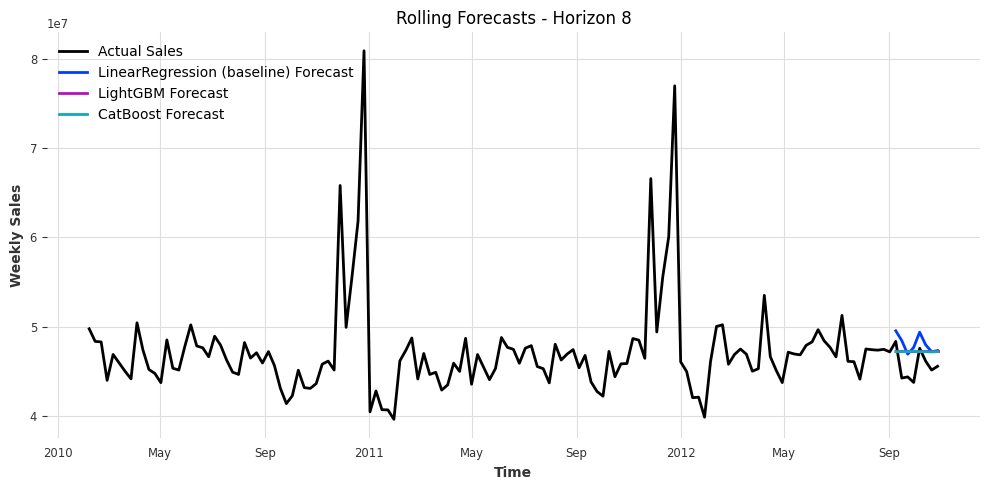

Training LinearRegression (baseline) with horizon 12...


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configura

Training CatBoost with horizon 12...


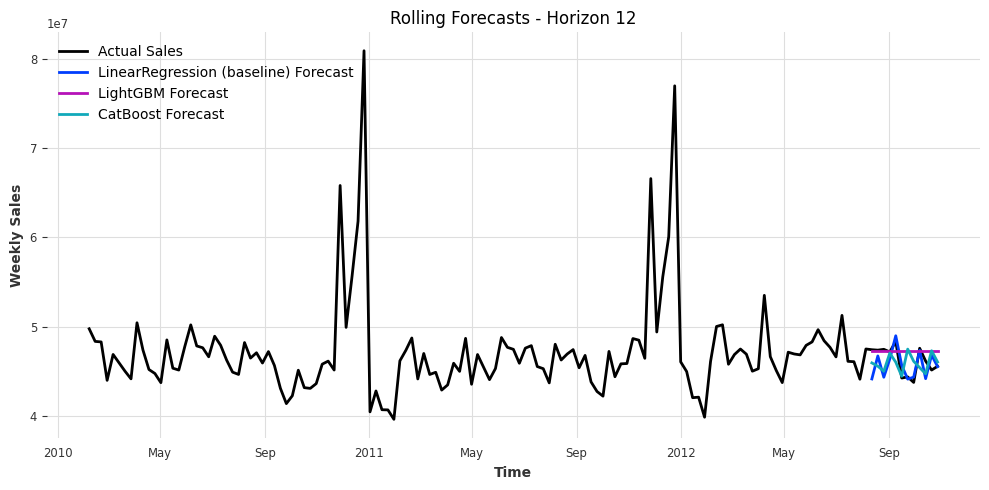

Rolling Window Forecast Evaluation Results:

                         Model  Horizon           MSE          RMSE  \
1                     LightGBM        4  3.950853e+13  4.373864e+06   
2                     CatBoost        4  4.213856e+13  4.488722e+06   
0  LinearRegression (baseline)        4  2.454951e+15  1.963912e+07   
4                     LightGBM        8  4.092095e+13  4.799541e+06   
5                     CatBoost        8  5.303970e+13  5.330519e+06   
3  LinearRegression (baseline)        8  2.439910e+17  6.863239e+07   
7                     LightGBM       12  4.144363e+13  5.105996e+06   
8                     CatBoost       12  5.227784e+13  5.592511e+06   
6  LinearRegression (baseline)       12  7.970620e+19  8.724250e+08   

         MAPE      SMAPE  
1    7.168220   7.308580  
2    7.992493   7.676640  
0   35.614986  22.433852  
4    7.182947   7.363153  
5    8.868247   8.618727  
3  107.097444  28.954575  
7    7.194356   7.396014  
8    8.498130   8.425666  
6

In [ ]:
from darts.models import RegressionModel, LightGBMModel, CatBoostModel
from sklearn.linear_model import LinearRegression
from darts.metrics import mse, rmse, mape, smape
import matplotlib.pyplot as plt
import pandas as pd

forecast_horizons = [4, 8, 12]

models_multi = {
    "LinearRegression (baseline)": RegressionModel(
        model=LinearRegression(),
        lags=1,
        lags_past_covariates=[-6, -12]
    ),
    "LightGBM": LightGBMModel(
        lags=1,
        lags_past_covariates=[-6, -12]
    ),
    "CatBoost": CatBoostModel(
        lags=1,
        lags_past_covariates=[-6, -12]
    ),
}

results_rolling_multi = {
    "Model": [],
    "Horizon": [],
    "MSE": [],
    "RMSE": [],
    "MAPE": [],
    "SMAPE": []
}

# Loop through forecast horizons
for horizon in forecast_horizons:
    plt.figure(figsize=(10, 5))
    target_series.plot(label="Actual Sales")

    for model_name, model in models_multi.items():
        print(f"Training {model_name} with horizon {horizon}...")

        forecast_list = model.historical_forecasts(
            series=target_series,
            past_covariates=covariates_series,
            train_length=20,
            forecast_horizon=horizon,
            stride=1,
            retrain=True,
            overlap_end=False,
            last_points_only=False,
            verbose=False
        )

        # Align actuals to forecasts
        actual_list = [target_series.slice_intersect(forecast) for forecast in forecast_list]

        # Calculate metrics per step
        mse_vals = [mse(a, f) for a, f in zip(actual_list, forecast_list)]
        rmse_vals = [rmse(a, f) for a, f in zip(actual_list, forecast_list)]
        mape_vals = [mape(a, f) for a, f in zip(actual_list, forecast_list)]
        smape_vals = [smape(a, f) for a, f in zip(actual_list, forecast_list)]

        # Store average metrics
        results_rolling_multi["Model"].append(model_name)
        results_rolling_multi["Horizon"].append(horizon)
        results_rolling_multi["MSE"].append(np.mean(mse_vals))
        results_rolling_multi["RMSE"].append(np.mean(rmse_vals))
        results_rolling_multi["MAPE"].append(np.mean(mape_vals))
        results_rolling_multi["SMAPE"].append(np.mean(smape_vals))

        # Plot last forecast as example
        forecast_list[-1].plot(label=f"{model_name} Forecast")

    # Finalize the plot for this horizon
    plt.title(f"Rolling Forecasts - Horizon {horizon}")
    plt.xlabel("Time")
    plt.ylabel("Weekly Sales")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Show evaluation results
results_rolling_df_multi = pd.DataFrame(results_rolling_multi)
print("Rolling Window Forecast Evaluation Results:\n")
print(results_rolling_df_multi.sort_values(by=["Horizon", "MAPE"]))

In [ ]:
results_rolling_df_multi

,Model,Horizon,MSE,RMSE,MAPE,SMAPE
0,LinearRegression (baseline),4,2.454951e+15,1.963912e+07,35.614986,22.433852
1,LightGBM,4,3.950853e+13,4.373864e+06,7.168220,7.308580
2,CatBoost,4,4.213856e+13,4.488722e+06,7.992493,7.676640
3,LinearRegression (baseline),8,2.439910e+17,6.863239e+07,107.097444,28.954575
4,LightGBM,8,4.092095e+13,4.799541e+06,7.182947,7.363153
5,CatBoost,8,5.303970e+13,5.330519e+06,8.868247,8.618727
6,LinearRegression (baseline),12,7.970620e+19,8.724250e+08,904.653299,34.230873
7,LightGBM,12,4.144363e+13,5.105996e+06,7.194356,7.396014
8,CatBoost,12,5.227784e+13,5.592511e+06,8.498130,8.425666


## Expanding window

Training LinearRegression (baseline) with horizon 4...


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

Training CatBoost with horizon 4...


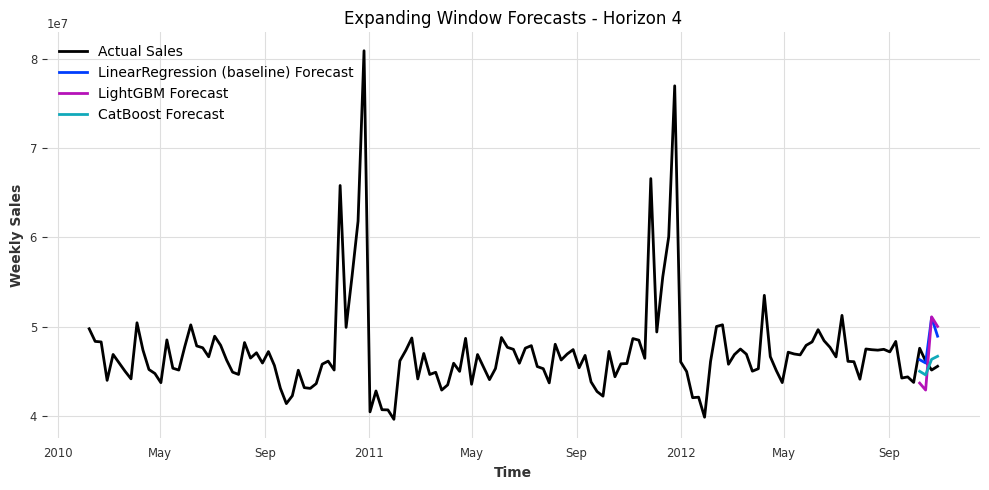

Training LinearRegression (baseline) with horizon 8...


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

Training CatBoost with horizon 8...


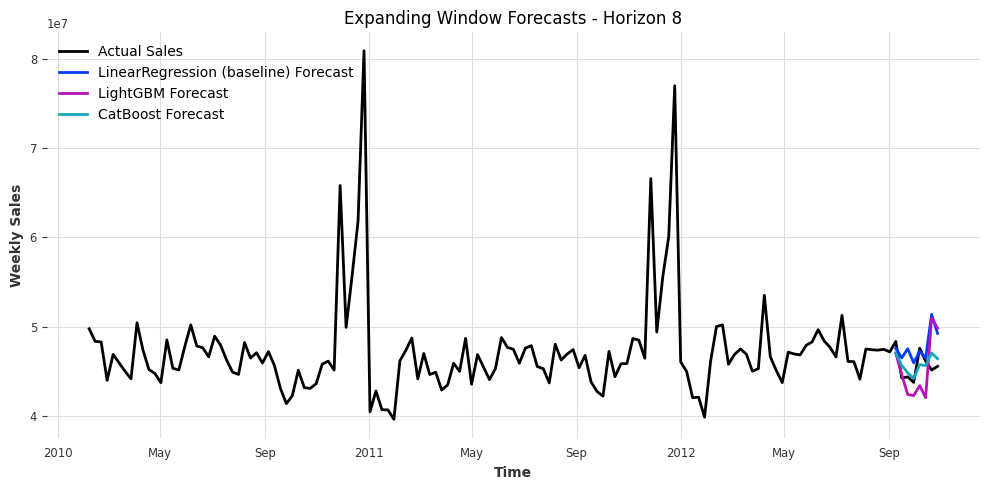

Training LinearRegression (baseline) with horizon 12...


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

Training CatBoost with horizon 12...


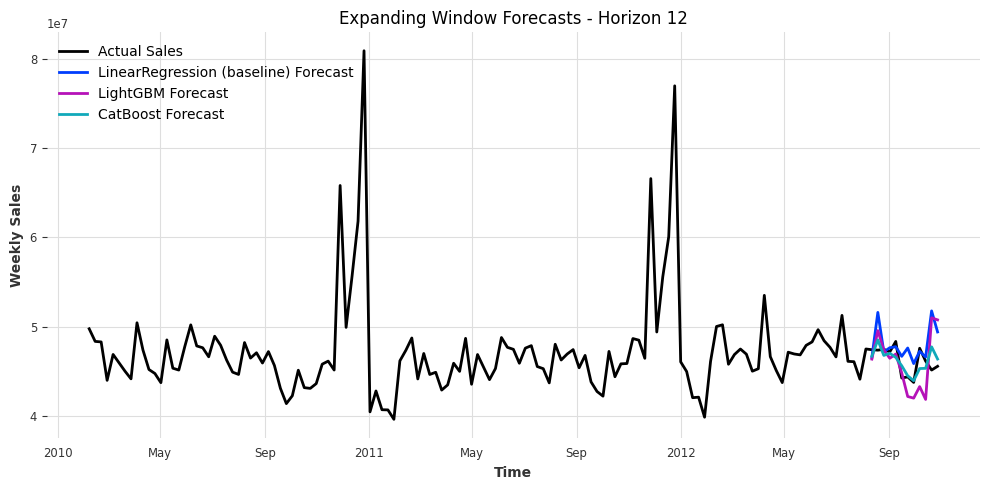

Expanding Window Forecast Evaluation Results:

                         Model  Horizon           MSE          RMSE  \
2                     CatBoost        4  2.669295e+13  3.097567e+06   
1                     LightGBM        4  3.955490e+13  4.537893e+06   
0  LinearRegression (baseline)        4  8.570298e+13  6.057743e+06   
5                     CatBoost        8  3.267775e+13  3.603618e+06   
4                     LightGBM        8  4.081489e+13  4.903603e+06   
3  LinearRegression (baseline)        8  1.640226e+14  8.256180e+06   
8                     CatBoost       12  3.196864e+13  3.797325e+06   
7                     LightGBM       12  4.154019e+13  5.234437e+06   
6  LinearRegression (baseline)       12  3.481366e+14  1.042762e+07   

        MAPE      SMAPE  
2   5.489649   5.324821  
1   7.773948   7.801212  
0  10.991411  10.514685  
5   5.922271   5.815050  
4   7.873213   7.903290  
3  14.240732  13.742664  
8   5.724432   5.723144  
7   7.956108   7.993887  
6  16.95

In [ ]:
from darts.models import RegressionModel, LightGBMModel, CatBoostModel
from darts.metrics import mse, rmse, mape, smape
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

forecast_horizons = [4, 8, 12]

models_multi = {
    "LinearRegression (baseline)": RegressionModel(
        model=LinearRegression(),
        lags=1,
        lags_past_covariates=[-6, -12]
    ),
    "LightGBM": LightGBMModel(
        lags=1,
        lags_past_covariates=[-6, -12]
    ),
    "CatBoost": CatBoostModel(
        lags=1,
        lags_past_covariates=[-6, -12]
    ),
}

results_expanding_multi = {
    "Model": [],
    "Horizon": [],
    "MSE": [],
    "RMSE": [],
    "MAPE": [],
    "SMAPE": []
}

for horizon in forecast_horizons:
    plt.figure(figsize=(10, 5))
    target_series.plot(label="Actual Sales")

    for model_name, model in models_multi.items():
        print(f"Training {model_name} with horizon {horizon}...")

        forecast_list = model.historical_forecasts(
            series=target_series,
            past_covariates=covariates_series,
            start=0.2,
            forecast_horizon=horizon,
            stride=1,
            retrain=True,
            last_points_only=False,
            verbose=False
        )

        # Align actuals to forecasts
        actual_list = [target_series.slice_intersect(forecast) for forecast in forecast_list]

        # Compute metrics
        mse_vals = [mse(a, f) for a, f in zip(actual_list, forecast_list)]
        rmse_vals = [rmse(a, f) for a, f in zip(actual_list, forecast_list)]
        mape_vals = [mape(a, f) for a, f in zip(actual_list, forecast_list)]
        smape_vals = [smape(a, f) for a, f in zip(actual_list, forecast_list)]

        # Store averaged metrics
        results_expanding_multi["Model"].append(model_name)
        results_expanding_multi["Horizon"].append(horizon)
        results_expanding_multi["MSE"].append(np.mean(mse_vals))
        results_expanding_multi["RMSE"].append(np.mean(rmse_vals))
        results_expanding_multi["MAPE"].append(np.mean(mape_vals))
        results_expanding_multi["SMAPE"].append(np.mean(smape_vals))

        # Plot last forecast
        forecast_list[-1].plot(label=f"{model_name} Forecast")

    plt.title(f"Expanding Window Forecasts - Horizon {horizon}")
    plt.xlabel("Time")
    plt.ylabel("Weekly Sales")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Show results
results_expanding_df_multi = pd.DataFrame(results_expanding_multi)
print("Expanding Window Forecast Evaluation Results:\n")
print(results_expanding_df_multi.sort_values(by=["Horizon", "MAPE"]))


In [ ]:
results_expanding_df_multi

,Model,Horizon,MSE,RMSE,MAPE,SMAPE
0,LinearRegression (baseline),4,8.570298e+13,6.057743e+06,10.991411,10.514685
1,LightGBM,4,3.955490e+13,4.537893e+06,7.773948,7.801212
2,CatBoost,4,2.669295e+13,3.097567e+06,5.489649,5.324821
3,LinearRegression (baseline),8,1.640226e+14,8.256180e+06,14.240732,13.742664
4,LightGBM,8,4.081489e+13,4.903603e+06,7.873213,7.903290
5,CatBoost,8,3.267775e+13,3.603618e+06,5.922271,5.815050
6,LinearRegression (baseline),12,3.481366e+14,1.042762e+07,16.955948,15.626736
7,LightGBM,12,4.154019e+13,5.234437e+06,7.956108,7.993887
8,CatBoost,12,3.196864e+13,3.797325e+06,5.724432,5.723144


## 6. Showing and visualizing the results

In [ ]:
results_rolling_df_univ

,Model,Horizon,MAPE,MSE,RMSE,SMAPE
0,AutoARIMA,4,8.591262,5.938446e+13,4.732700e+06,8.119966
1,Prophet,4,9.738678,6.532081e+13,5.206468e+06,9.289173
2,NaiveDrift,4,9.652424,6.781004e+13,5.166909e+06,9.180361
3,AutoARIMA,8,9.134174,6.613684e+13,5.404407e+06,8.744286
4,Prophet,8,11.481965,8.992441e+13,6.423516e+06,11.156992
5,NaiveDrift,8,11.906019,1.014721e+14,6.631578e+06,11.502523
6,AutoARIMA,12,9.278595,6.863952e+13,5.811909e+06,8.936006
7,Prophet,12,12.853306,1.147451e+14,7.457394e+06,12.741155
8,NaiveDrift,12,13.616219,1.355719e+14,7.835686e+06,13.459165


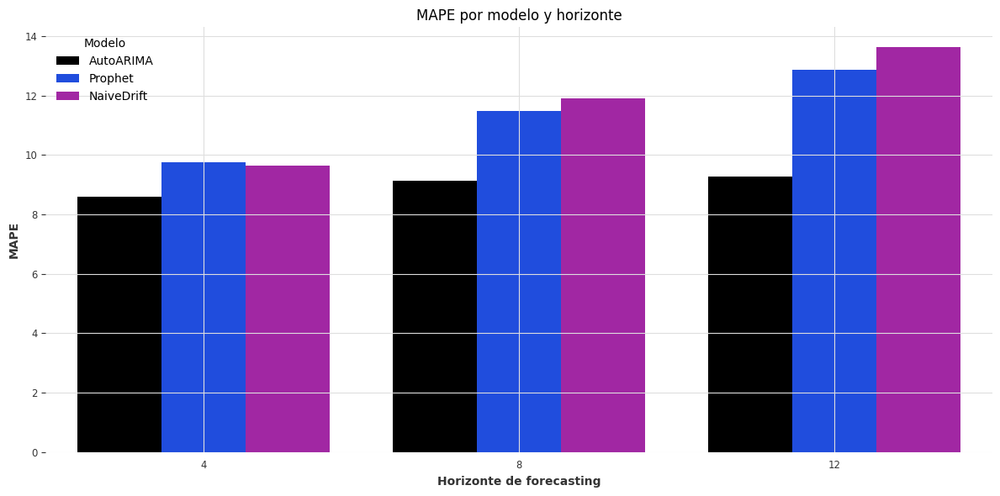

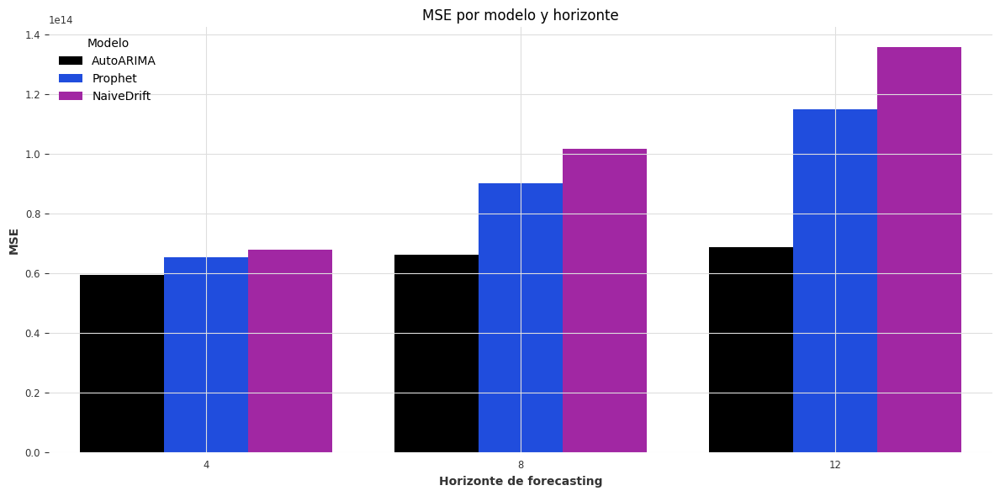

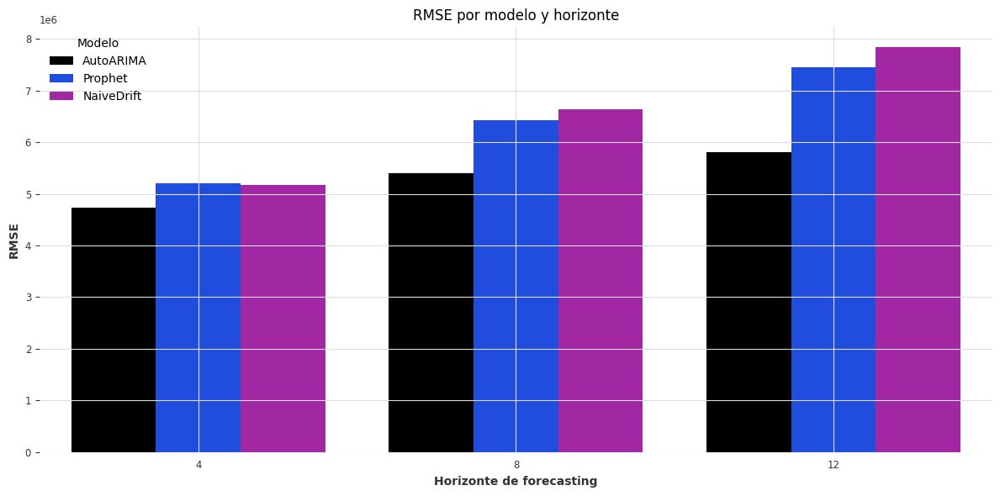

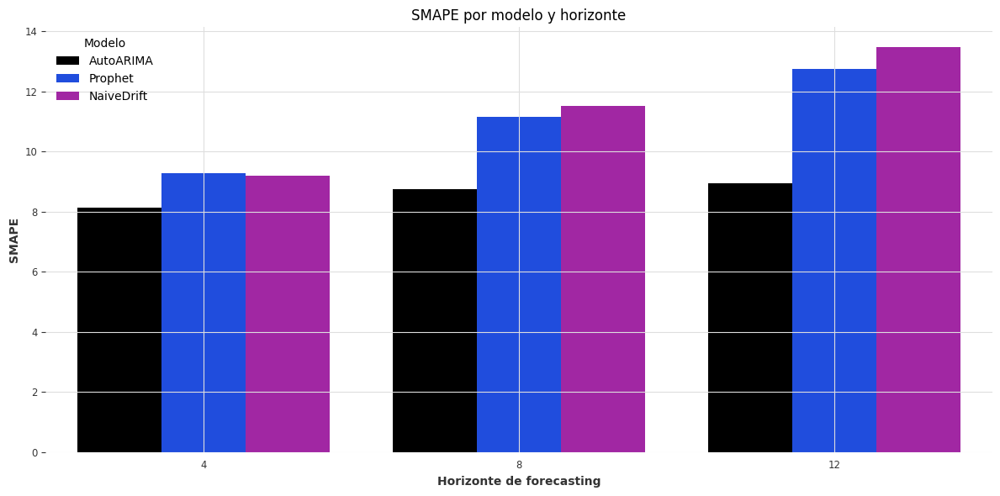

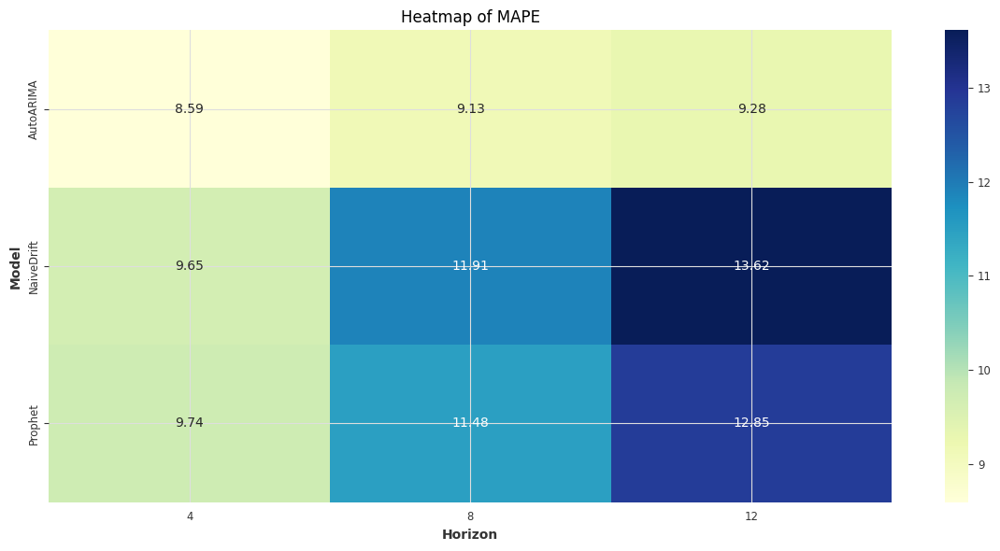

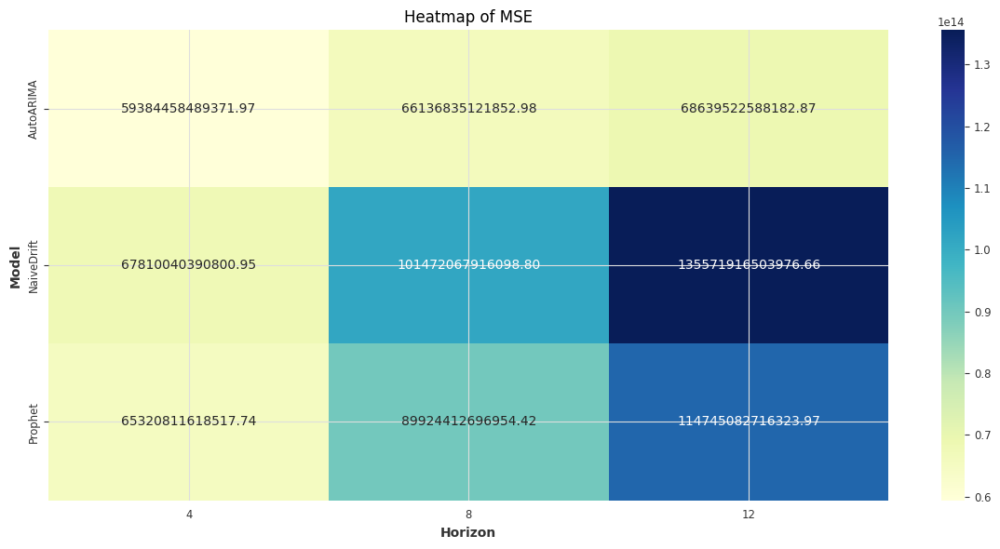

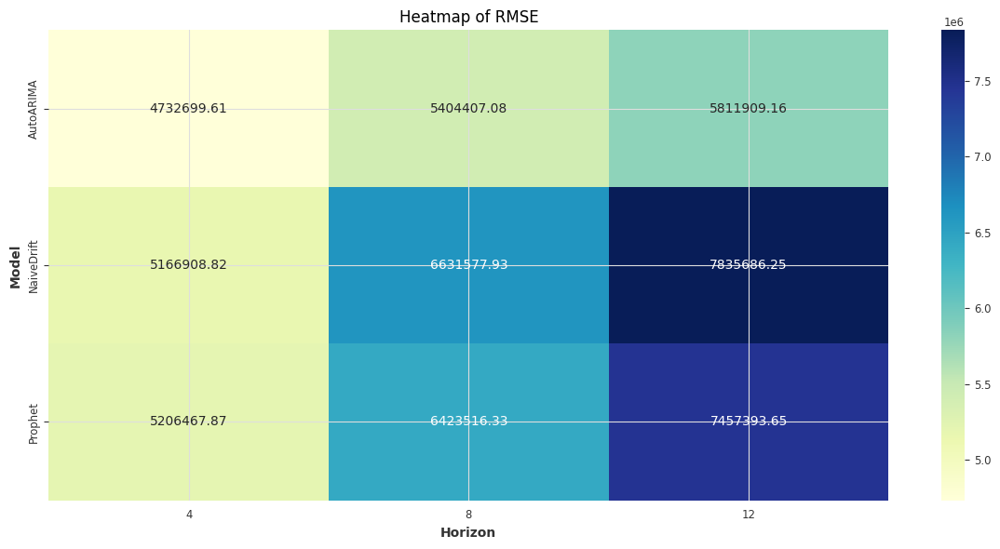

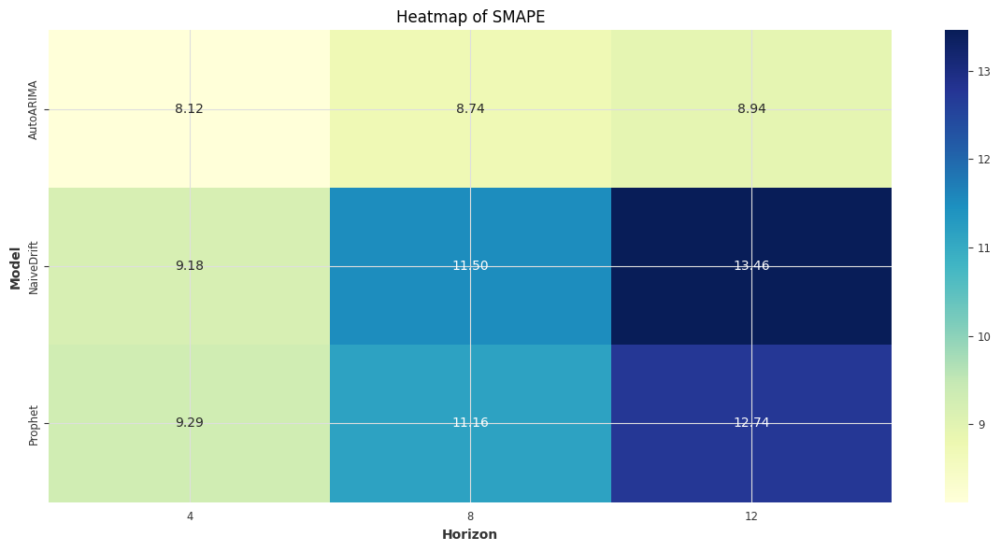

In [ ]:
import seaborn as sns

df_rolling_univ=results_rolling_df_univ.copy()
metrics = ["MAPE", "MSE", "RMSE", "SMAPE"]

# 1. Bar Plots: Metric vs. Horizon per Model
for metric in metrics:
    plt.figure(figsize=(12, 6))
    sns.barplot(data=df_rolling_univ, x="Horizon", y=metric, hue="Model")
    plt.title(f"{metric} por modelo y horizonte")
    plt.xlabel("Horizonte de forecasting")
    plt.ylabel(metric)
    plt.grid(True)
    plt.legend(title="Modelo")
    plt.tight_layout()
    plt.show()

# 2. Heatmaps: Metric per Model and Horizon
for metric in metrics:
    heatmap_data = df_rolling_univ.pivot(index="Model", columns="Horizon", values=metric)
    plt.figure(figsize=(12, 6))
    sns.heatmap(heatmap_data, annot=True, fmt=".2f", cmap="YlGnBu")
    plt.title(f"Heatmap of {metric}")
    plt.xlabel("Horizon")
    plt.ylabel("Model")
    plt.tight_layout()
    plt.show()

In [ ]:
results_expanding_df_univ

,Model,Horizon,MAPE,MSE,RMSE,SMAPE
0,AutoARIMA,4,7.078841,4.443244e+13,4.343746e+06,7.132259
1,Prophet,4,6.851596,4.139928e+13,4.273837e+06,7.036912
2,NaiveDrift,4,8.739018,6.076869e+13,4.843229e+06,8.324525
3,AutoARIMA,8,7.007156,4.575235e+13,4.776947e+06,7.147225
4,Prophet,8,6.995642,4.479086e+13,4.814356e+06,7.246039
5,NaiveDrift,8,10.373954,7.952256e+13,6.043700e+06,9.951897
6,AutoARIMA,12,6.884849,4.567944e+13,5.075455e+06,7.068611
7,Prophet,12,7.006483,4.610455e+13,5.188882e+06,7.287071
8,NaiveDrift,12,10.890951,8.942449e+13,6.703511e+06,10.549971


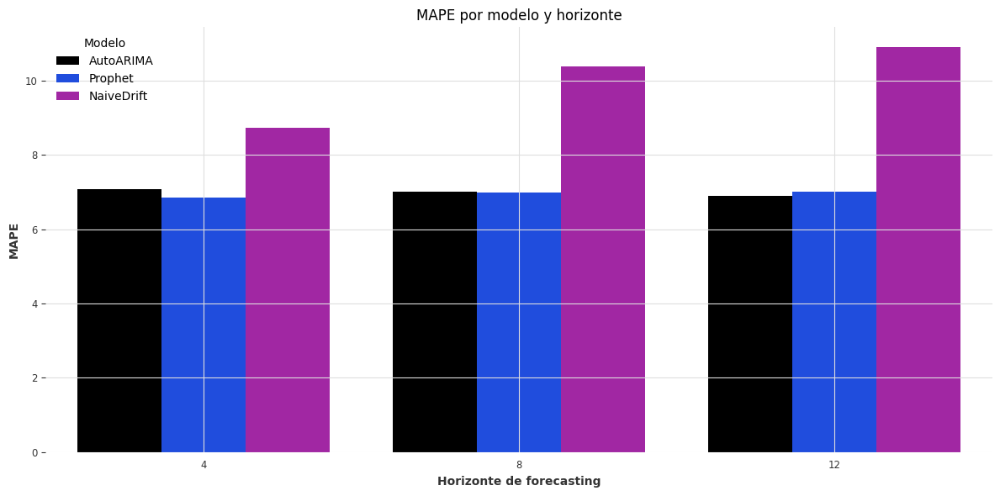

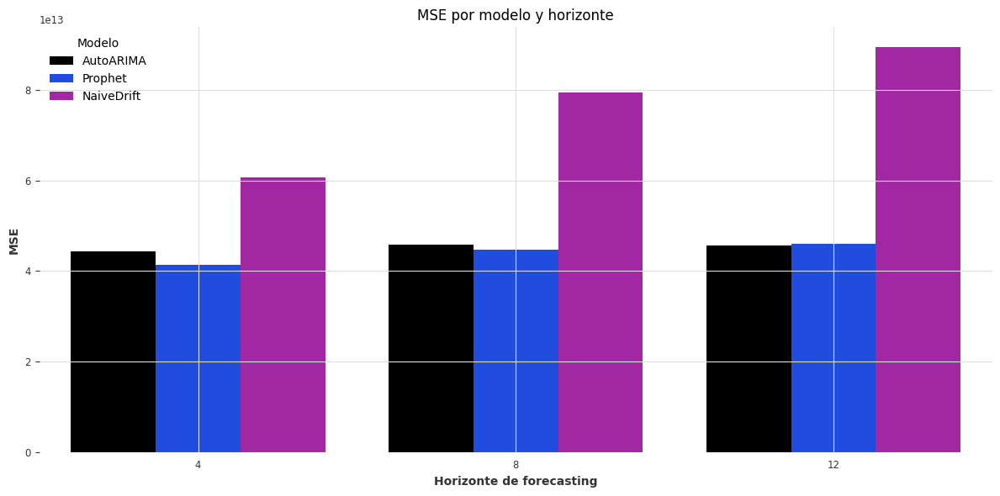

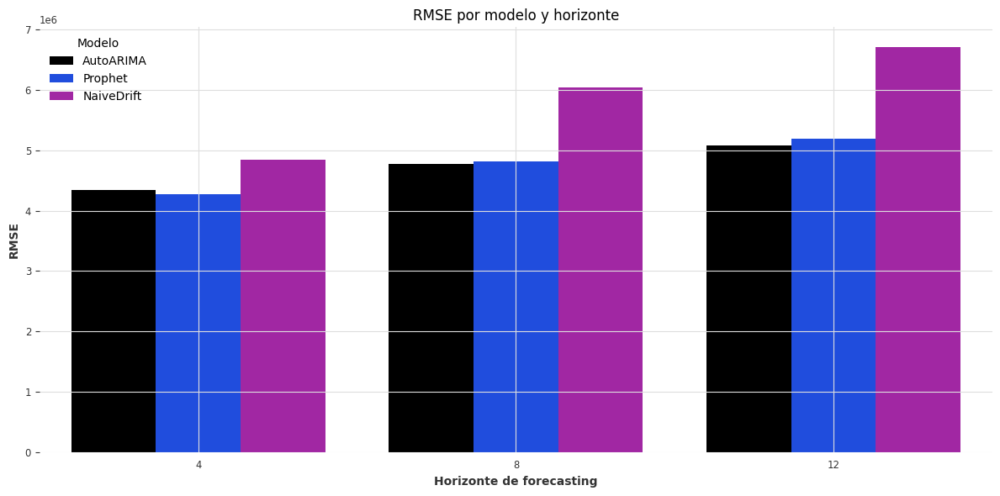

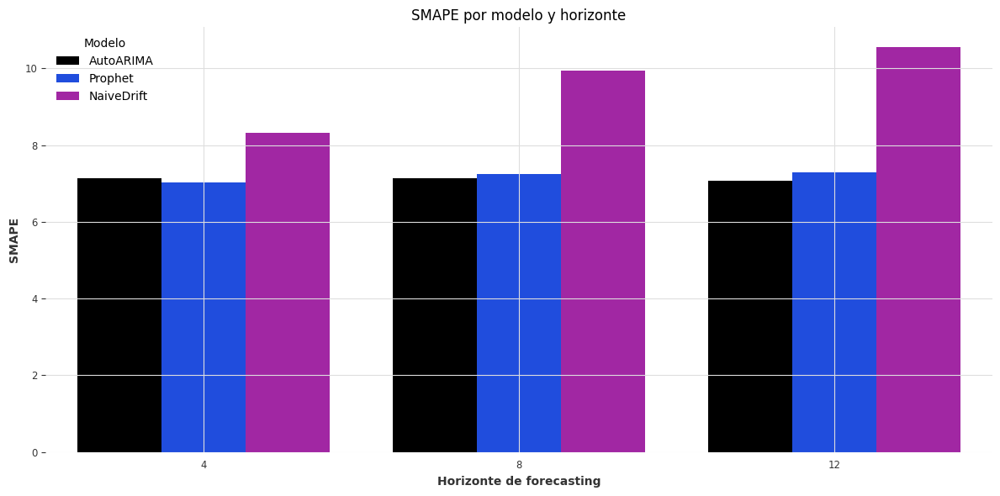

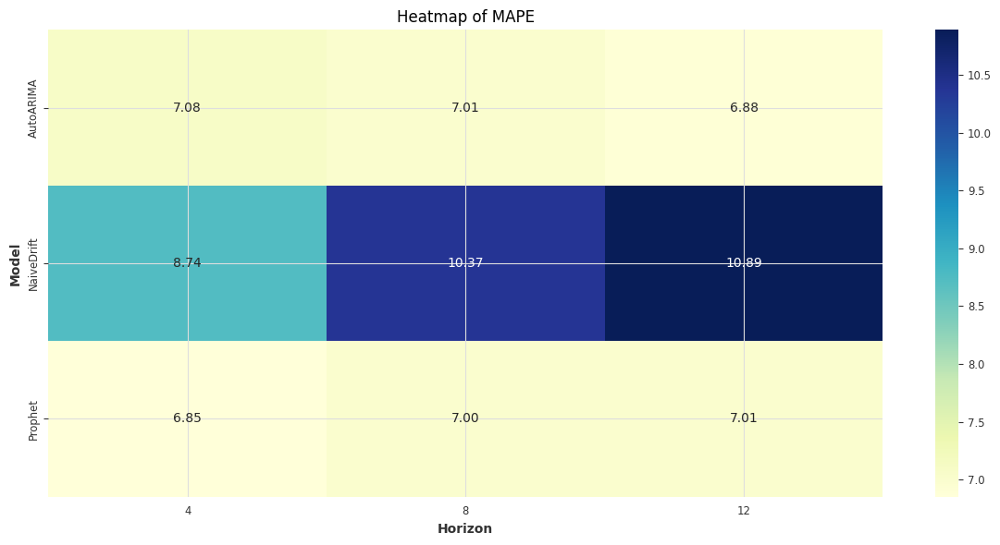

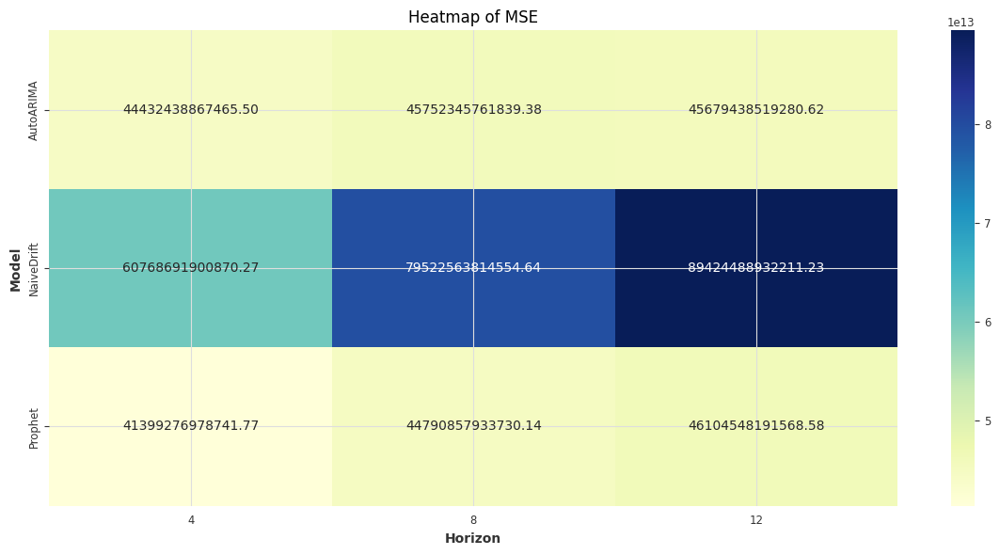

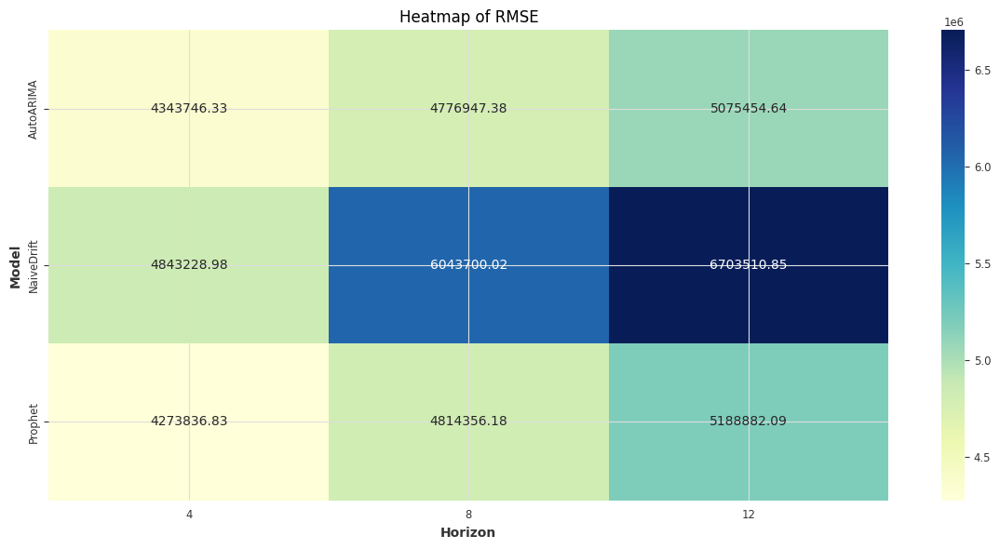

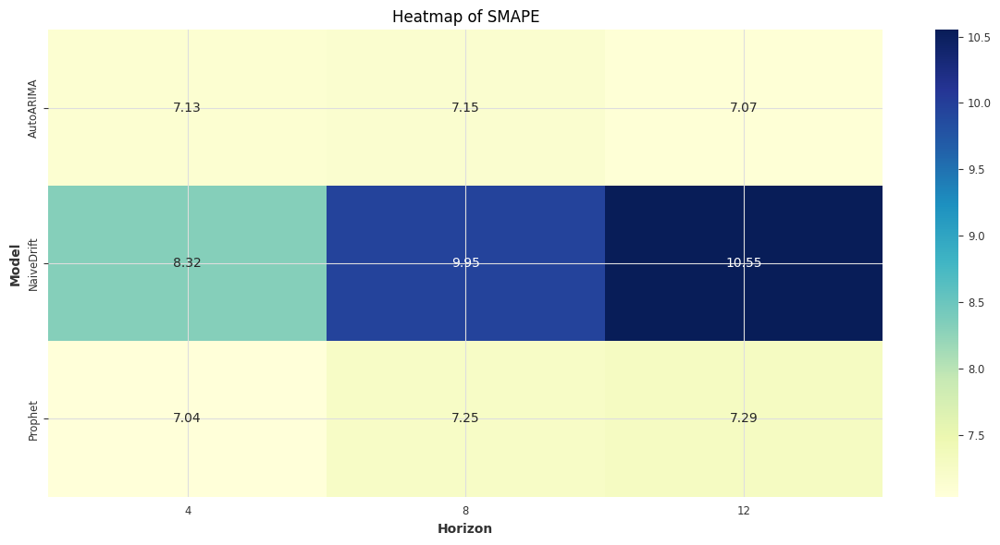

In [ ]:
df_expanding_univ=results_expanding_df_univ.copy()
metrics = ["MAPE", "MSE", "RMSE", "SMAPE"]

# 1. Bar Plots: Metric vs. Horizon per Model
for metric in metrics:
    plt.figure(figsize=(12, 6))
    sns.barplot(data=df_expanding_univ, x="Horizon", y=metric, hue="Model")
    plt.title(f"{metric} por modelo y horizonte")
    plt.xlabel("Horizonte de forecasting")
    plt.ylabel(metric)
    plt.grid(True)
    plt.legend(title="Modelo")
    plt.tight_layout()
    plt.show()

# 2. Heatmaps: Metric per Model and Horizon
for metric in metrics:
    heatmap_data = df_expanding_univ.pivot(index="Model", columns="Horizon", values=metric)
    plt.figure(figsize=(12, 6))
    sns.heatmap(heatmap_data, annot=True, fmt=".2f", cmap="YlGnBu")
    plt.title(f"Heatmap of {metric}")
    plt.xlabel("Horizon")
    plt.ylabel("Model")
    plt.tight_layout()
    plt.show()

In [ ]:
results_rolling_df_multi

,Model,Horizon,MSE,RMSE,MAPE,SMAPE
0,LinearRegression (baseline),4,2.454951e+15,1.963912e+07,35.614986,22.433852
1,LightGBM,4,3.950853e+13,4.373864e+06,7.168220,7.308580
2,CatBoost,4,4.213856e+13,4.488722e+06,7.992493,7.676640
3,LinearRegression (baseline),8,2.439910e+17,6.863239e+07,107.097444,28.954575
4,LightGBM,8,4.092095e+13,4.799541e+06,7.182947,7.363153
5,CatBoost,8,5.303970e+13,5.330519e+06,8.868247,8.618727
6,LinearRegression (baseline),12,7.970620e+19,8.724250e+08,904.653299,34.230873
7,LightGBM,12,4.144363e+13,5.105996e+06,7.194356,7.396014
8,CatBoost,12,5.227784e+13,5.592511e+06,8.498130,8.425666


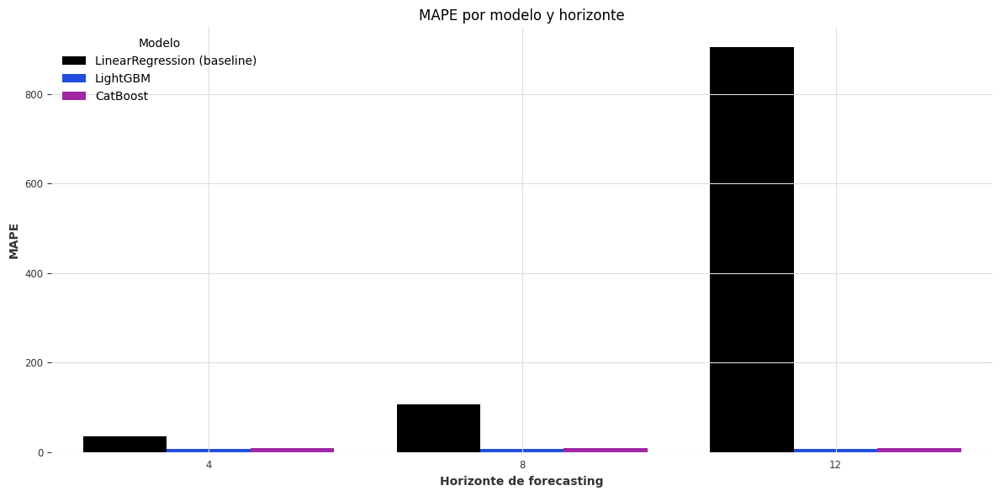

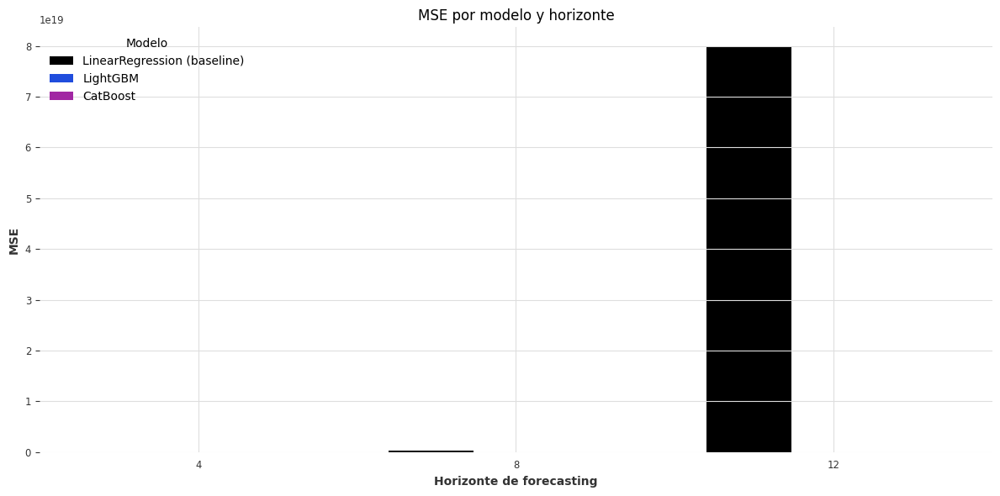

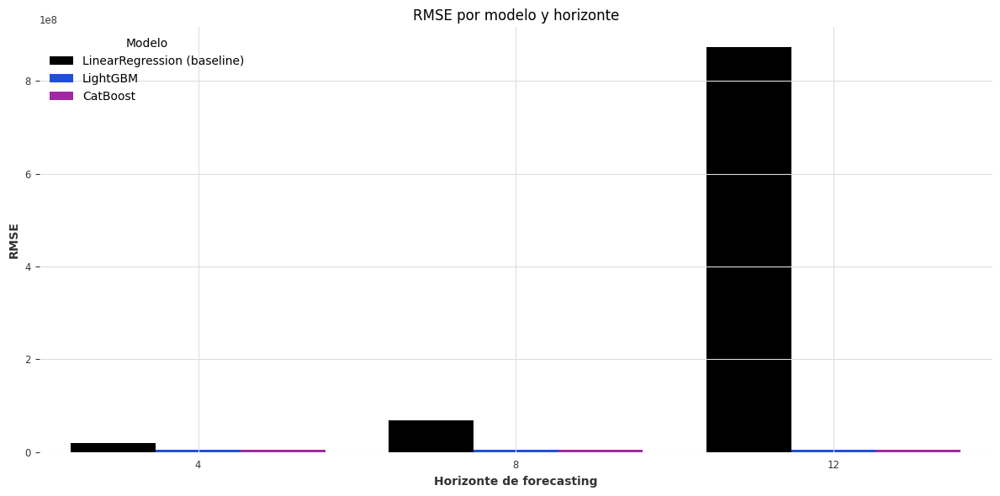

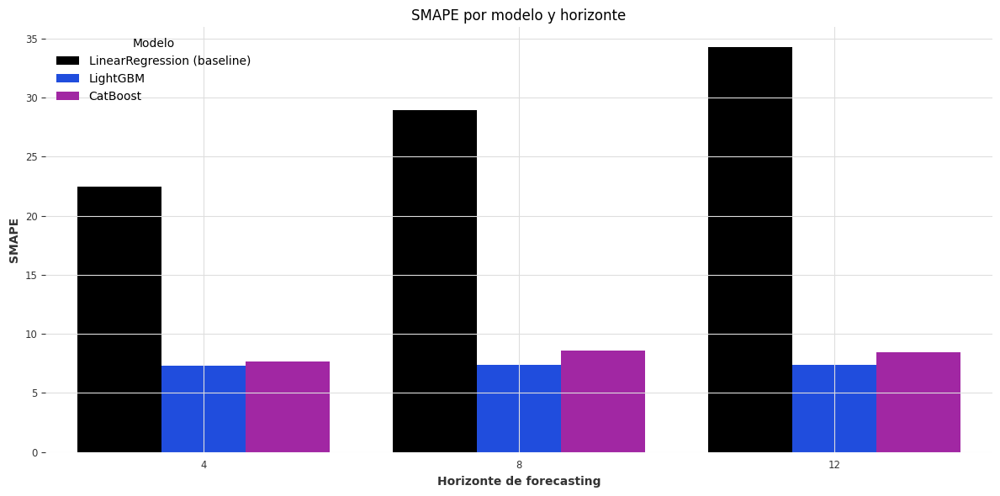

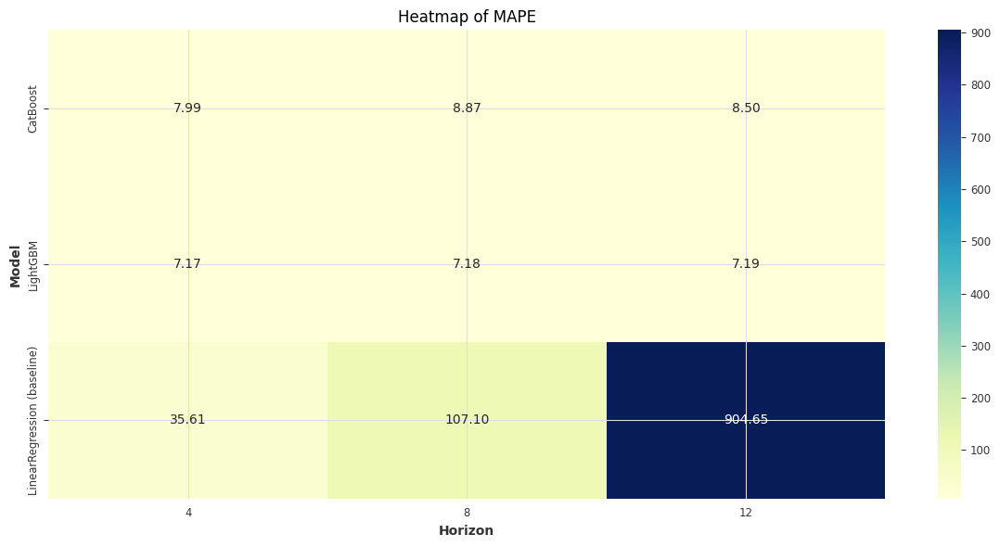

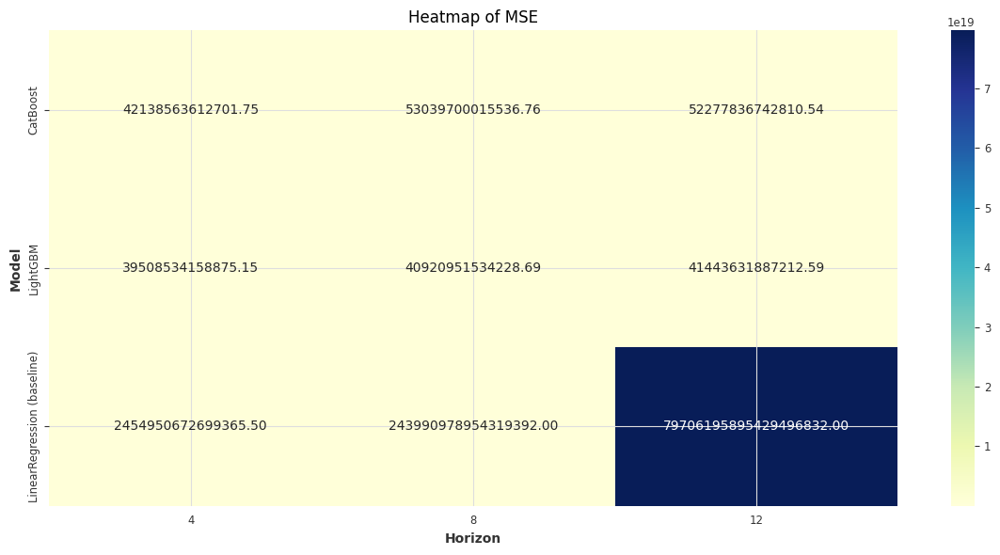

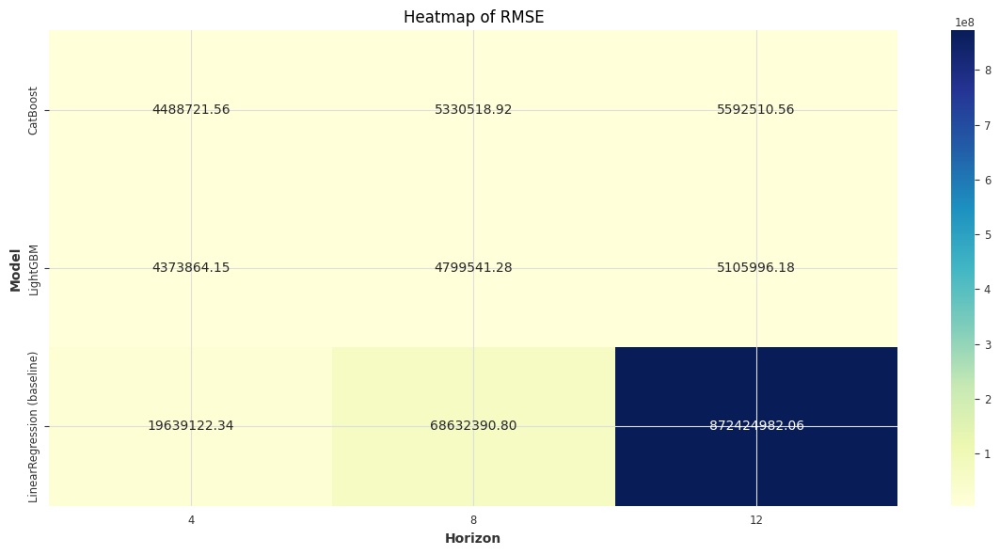

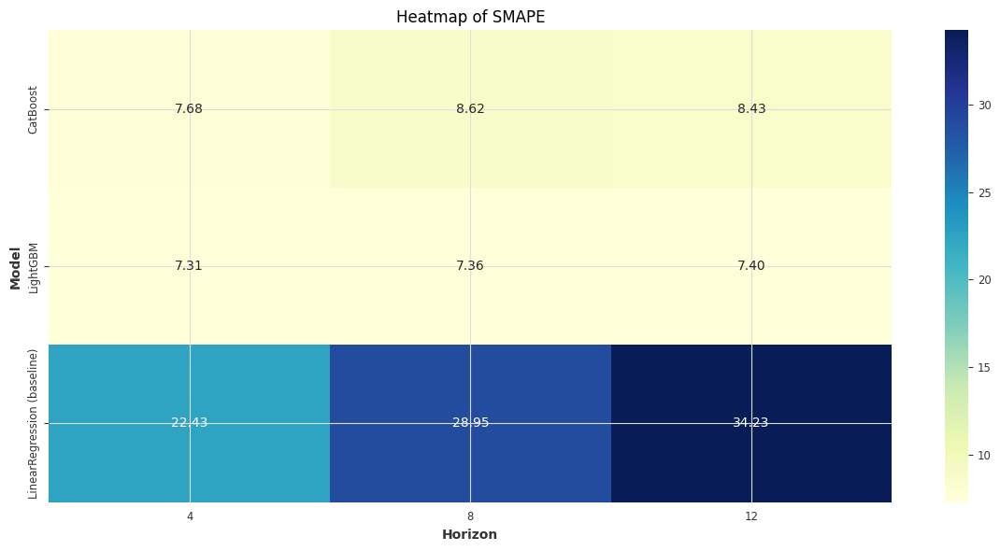

In [ ]:
df_rolling_multi=results_rolling_df_multi.copy()
metrics = ["MAPE", "MSE", "RMSE", "SMAPE"]

# 1. Bar Plots: Metric vs. Horizon per Model
for metric in metrics:
    plt.figure(figsize=(12, 6))
    sns.barplot(data=df_rolling_multi, x="Horizon", y=metric, hue="Model")
    plt.title(f"{metric} por modelo y horizonte")
    plt.xlabel("Horizonte de forecasting")
    plt.ylabel(metric)
    plt.grid(True)
    plt.legend(title="Modelo")
    plt.tight_layout()
    plt.show()

# 2. Heatmaps: Metric per Model and Horizon
for metric in metrics:
    heatmap_data = df_rolling_multi.pivot(index="Model", columns="Horizon", values=metric)
    plt.figure(figsize=(12, 6))
    sns.heatmap(heatmap_data, annot=True, fmt=".2f", cmap="YlGnBu")
    plt.title(f"Heatmap of {metric}")
    plt.xlabel("Horizon")
    plt.ylabel("Model")
    plt.tight_layout()
    plt.show()

In [ ]:
results_expanding_df_multi

,Model,Horizon,MSE,RMSE,MAPE,SMAPE
0,LinearRegression (baseline),4,8.570298e+13,6.057743e+06,10.991411,10.514685
1,LightGBM,4,3.955490e+13,4.537893e+06,7.773948,7.801212
2,CatBoost,4,2.669295e+13,3.097567e+06,5.489649,5.324821
3,LinearRegression (baseline),8,1.640226e+14,8.256180e+06,14.240732,13.742664
4,LightGBM,8,4.081489e+13,4.903603e+06,7.873213,7.903290
5,CatBoost,8,3.267775e+13,3.603618e+06,5.922271,5.815050
6,LinearRegression (baseline),12,3.481366e+14,1.042762e+07,16.955948,15.626736
7,LightGBM,12,4.154019e+13,5.234437e+06,7.956108,7.993887
8,CatBoost,12,3.196864e+13,3.797325e+06,5.724432,5.723144


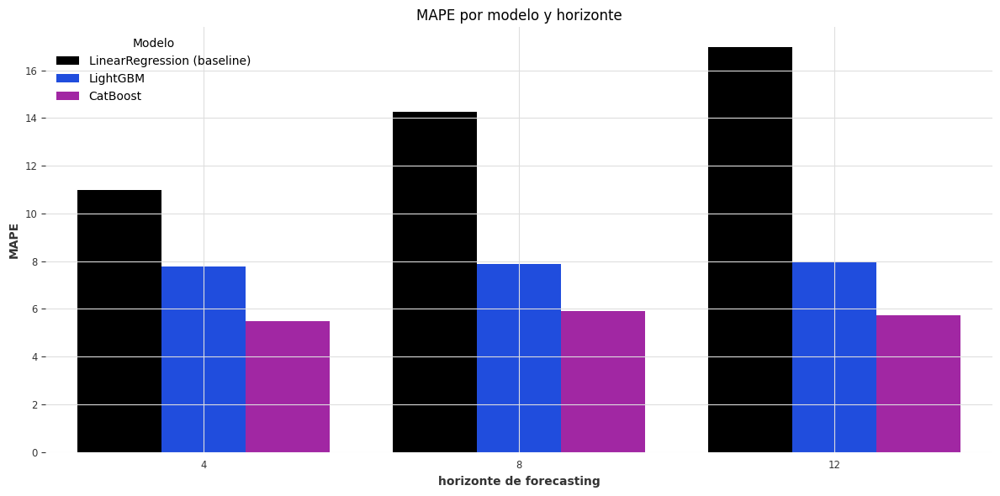

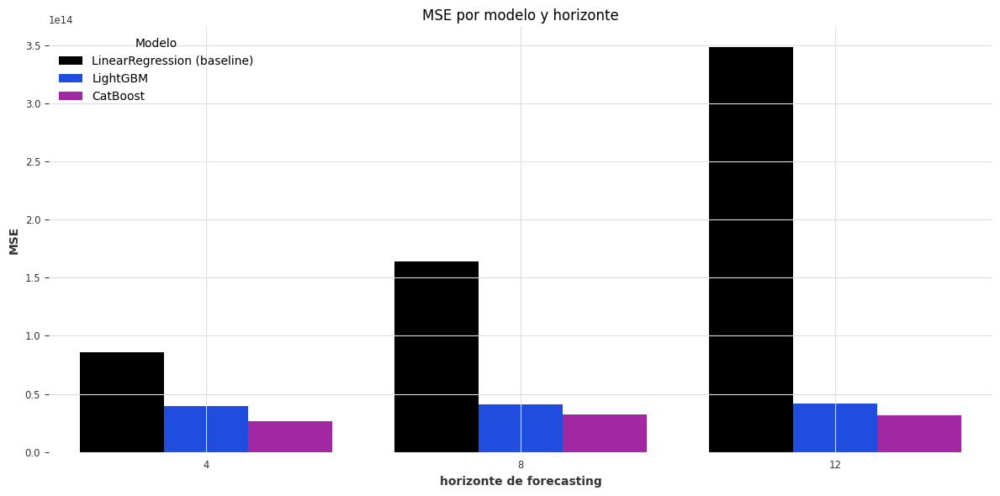

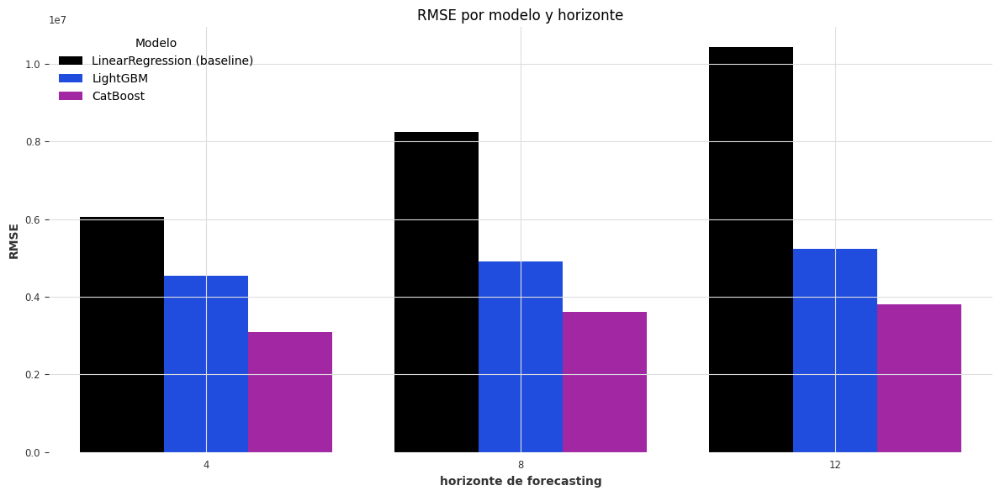

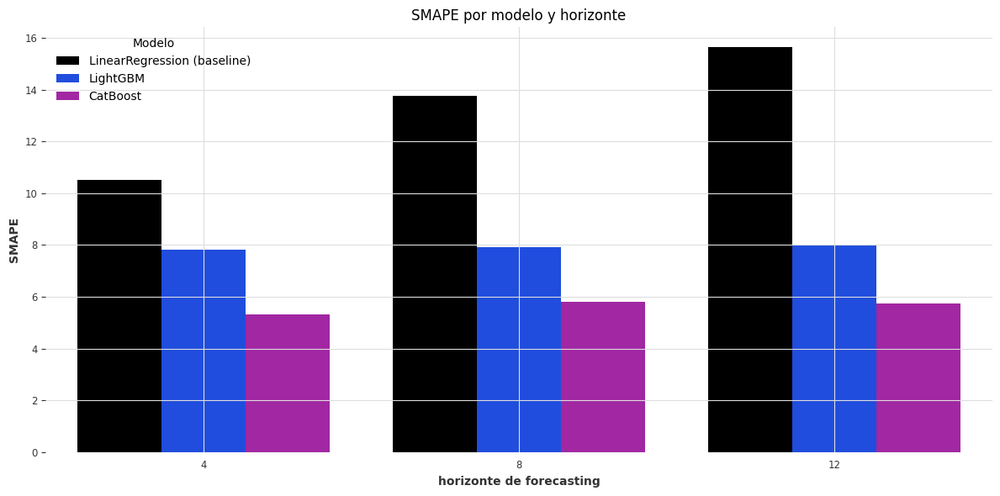

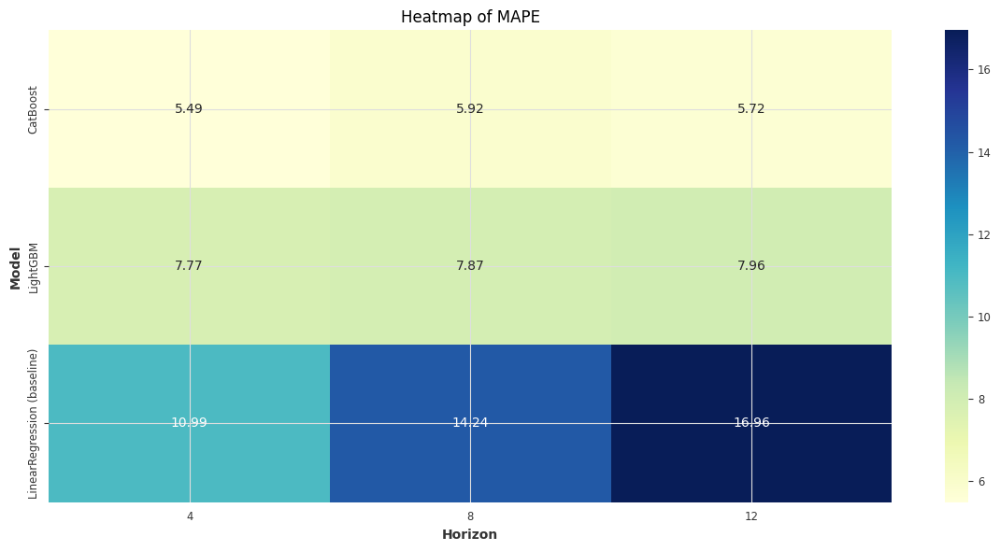

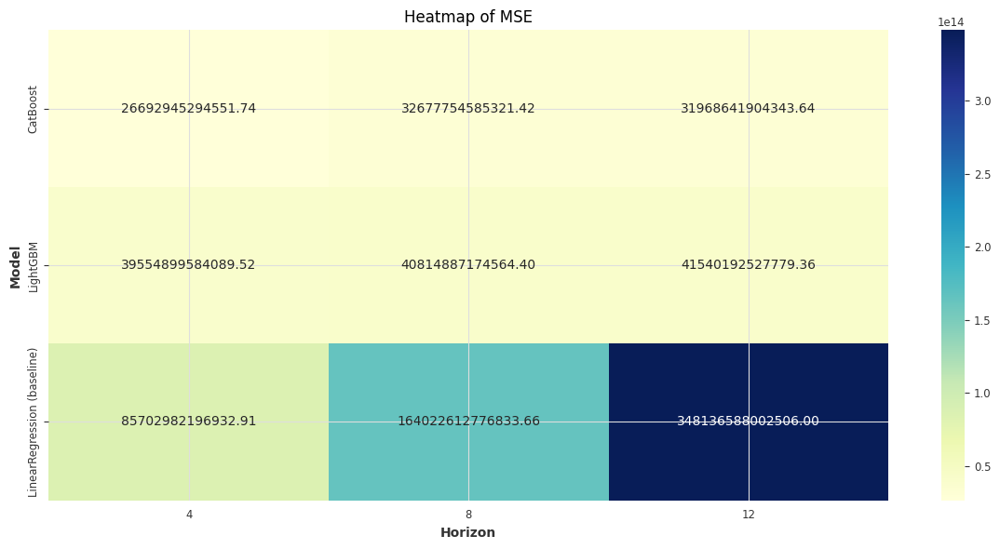

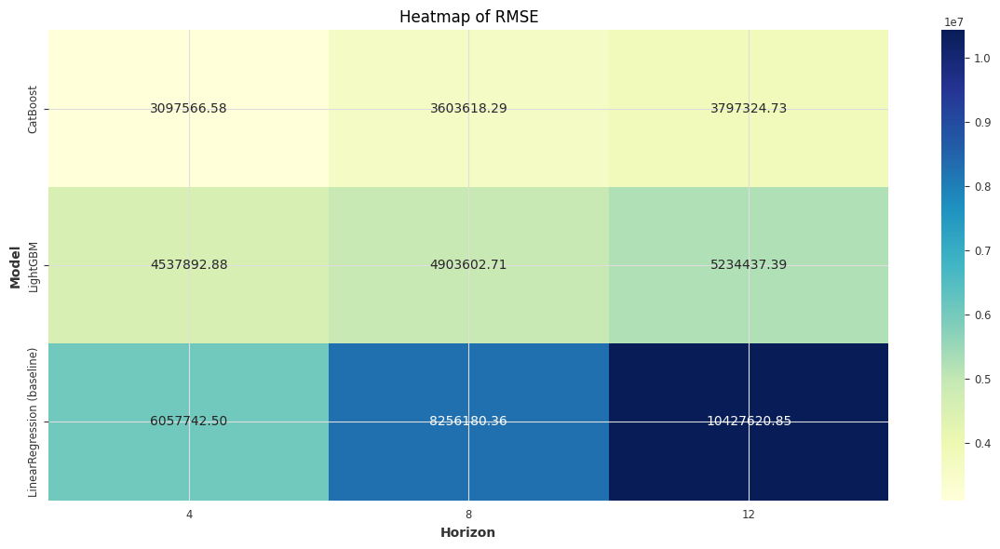

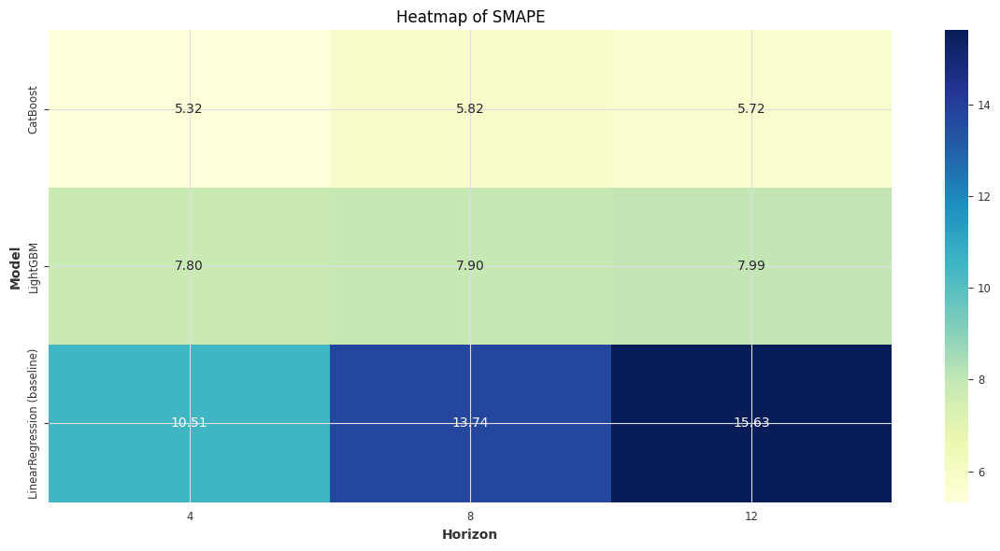

In [ ]:
df_expanding_multi=results_expanding_df_multi.copy()
metrics = ["MAPE", "MSE", "RMSE", "SMAPE"]

# 1. Bar Plots: Metric vs. Horizon per Model
for metric in metrics:
    plt.figure(figsize=(12, 6))
    sns.barplot(data=df_expanding_multi, x="Horizon", y=metric, hue="Model")
    plt.title(f"{metric} por modelo y horizonte")
    plt.xlabel("horizonte de forecasting")
    plt.ylabel(metric)
    plt.grid(True)
    plt.legend(title="Modelo")
    plt.tight_layout()
    plt.show()

# 2. Heatmaps: Metric per Model and Horizon
for metric in metrics:
    heatmap_data = df_expanding_multi.pivot(index="Model", columns="Horizon", values=metric)
    plt.figure(figsize=(12, 6))
    sns.heatmap(heatmap_data, annot=True, fmt=".2f", cmap="YlGnBu")
    plt.title(f"Heatmap of {metric}")
    plt.xlabel("Horizon")
    plt.ylabel("Model")
    plt.tight_layout()
    plt.show()

## 9.Exporting the results

In [ ]:
results_rolling_df_univ.to_csv(path_or_buf="/content/drive/MyDrive/TFM/roll_df_univ1.csv")
results_rolling_df_multi.to_csv(path_or_buf="/content/drive/MyDrive/TFM/roll_df_multi1.csv")
results_expanding_df_univ.to_csv(path_or_buf="/content/drive/MyDrive/TFM/expand_df_univ1.csv")
results_expanding_df_multi.to_csv(path_or_buf="/content/drive/MyDrive/TFM/expand_df_multi1.csv")